In [18]:
# !pip install umap-learn

In [19]:
# import phate

In [1]:
import os 
import MDAnalysis as mda
import pandas as pd
from scipy.spatial.distance import pdist
from MDAnalysis.analysis.align import AlignTraj
import numpy as np
dragon_dir = "/homes/hussain/hussain-simulation_hdx/projects/xMD"
os.chdir(dragon_dir)

import os
os.environ["HDXER_PATH"] = "/homes/hussain/HDXer"

import sys
sys.path.append("/homes/hussain/hussain-simulation_hdx/projects/ValDX")


/homes/hussain/hussain-simulation_hdx/programs/miniconda3/envs/p310_MDA/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def segs_to_df(path: str, names=['ResStr', 'ResEnd']):
    """Read and create a pandas DataFrame using a residue segments file.
    
    Args:
        path: The path to the residue segments file.
    
    Returns:
        df: A pandas DataFrame containing data for the given argument.
        names: A list of column names for the DataFrame. (ResStr, ResEnd)
    """
    df = pd.read_csv(path, sep='\s+', header=None, names=names)
    df["peptide"] = df.index
    return df



class Segments():
    """
    takes in a dataframe of experimental hdx segments 
    and contains the values of the peptides
    """
    def __init__(self, segs_df: pd.DataFrame=None, segs_path:str=None, keys=['ResStr', 'ResEnd']):
        if segs_df is not None:
            self.segs_df = segs_df.copy()
        if segs_path is not None:
            self.segs_df = segs_to_df(segs_path)
        self.keys = keys
        if "peptide" not in self.segs_df.columns:
            self.segs_df["peptide"] = np.arange(len(self.segs_df))
        self.pep_nums = self.get_pep_nums(self.segs_df)
        assert len(self.segs_df["peptide"].unique()) == len(self.pep_nums), "Peptides are not unique"
        print(f"Segments class created with {len(self.pep_nums)} peptides")
        self.res_nums = self.get_resnums(self.segs_df)
        self.residues = self.get_residues(self.segs_df)
        self.peptides = self.get_peptides(self.segs_df)
        self.residue_centrality = self.get_residue_centrality(self.segs_df)
        self.peptide_centrality = self.get_peptide_centrality(self.segs_df)

    def get_resnums(self, df: pd.DataFrame, keys=None):
        """
        Get the residue numbers of the segments in the dataframe
        """
        if df is None:
            df = self.segs_df
        
        if keys is None:
            keys = self.keys
        res_nums = df.apply(lambda x: np.arange(x[keys[0]]+1, x[keys[1]]+1), 
                            axis=1).to_numpy()
        print(f"Resnumbers calculated for {len(res_nums)} segments")
        return res_nums
    
    def get_peptides(self, df: pd.DataFrame=None):
        """
        Get the peptides from the dataframe,
        creates a dictionary with the peptide number as the key and the residues as the values
        """
        if df is None:
            df = self.segs_df
        peptides = {pep: res for pep, res in zip(df["peptide"], 
                                                 self.get_resnums(df))}
        print(f"Peptides calculated for {len(peptides)} segments")
        return peptides
    
    def get_residues(self, df: pd.DataFrame=None):
        """
        Get the residues from the dataframe
        """
        if df is None:
            df = self.segs_df
        residues = np.unique(np.concatenate(self.get_resnums(df)))
        print(f"Residues calculated for {len(residues)} segments")
        return residues
    
    def get_pep_nums(self, df: pd.DataFrame=None):
        """
        Get the peptide numbers from the dataframe
        """
        if df is None:
            df = self.segs_df
        return df["peptide"].to_numpy()
        
    def get_residue_centrality(self, df: pd.DataFrame):
        """
        calculate the number of peptides that contain each residue
        """
        print("Calculating residue centrality")
        if df is None:
            df = self.segs_df

        res_nums = self.get_resnums(df)

        res_cent = {res: 0 for res in self.residues}

        for res in self.residues:
            for res_num in res_nums:
                if res in res_num:
                    res_cent[res] += 1

        return res_cent

    def get_peptide_centrality(self, df: pd.DataFrame):
        """
        calculate the mean residue centrality for each peptide
        """

        print("Calculating peptide centrality")
        if df is None:
            df = self.segs_df
        peptides = self.get_peptides(df)
        res_cent = self.get_residue_centrality(df)

        pep_cent = {pep: np.mean([res_cent[res] for res in res_nums]) 
                    for pep, res_nums in peptides.items()}
        
        print(f"Peptide centrality calculated for {len(pep_cent)} peptides")
        return pep_cent
    
    def update(self, df: pd.DataFrame=None):
        """
        Update the values of the class
        """
        if df is not None:
            self.segs_df = df.copy()
        self.residues = self.get_residues(self.segs_df)
        self.res_nums = self.get_resnums(self.segs_df)
        self.peptides = self.get_peptides(self.segs_df)
        self.pep_nums = self.get_pep_nums(self.segs_df)

        self.residue_centrality = self.get_residue_centrality(self.segs_df)
        self.peptide_centrality = self.get_peptide_centrality(self.segs_df)


    def df_from_peptides(self, peptides: dict):
        """
        Update the dataframe with the peptides and residues
        Peptide is the index of the dataframe
        """
        keys = self.keys
        print(f"Creating dataframe from peptides {peptides}")
        df = pd.DataFrame(columns=[keys[0], keys[1], "peptide"])
    
        for pep, res in peptides.items():
            df = pd.concat([df, pd.DataFrame({keys[0]: res[0], 
                                              keys[1]: res[-1], 
                                              "peptide": pep}, 
                                              index=[pep])])
        print("Dataframe created")
        print(df.head())
        return df
    
    def df_select_peptides(self, pep_nums: list):
        """
        Select the peptides from the dataframe
        """
        print(f"Selecting {pep_nums} peptides from the dataframe")
        return self.segs_df.loc[pep_nums].copy()
    
    def df_remove_peptides(self, pep_nums: list):
        """
        Remove the peptides from the dataframe
        """
        print(f"Removing {pep_nums} peptides from the dataframe")
        return self.segs_df.loc[~self.segs_df["peptide"].isin(pep_nums)].copy()
    
    def df_select_residues(self, residues: list):
        """
        Select peptides from the dataframe based on the residues
        """
        print(f"Selecting peptides with residues {residues}")
        unique_res = np.unique(residues)

        selected_peptides = []
        for pep, res in self.peptides.items():
            if len(np.intersect1d(res, unique_res)) > 0:
                selected_peptides.append(pep)
        return self.df_select_peptides(selected_peptides).copy()

    def df_remove_residues(self, residues: list):
        """
        Remove peptides from the dataframe based on the residues
        """
        print(f"Removing peptides with residues {residues}")
        unique_res = np.unique(residues)

        selected_peptides = []
        for pep, res in self.peptides.items():
            if len(np.intersect1d(res, unique_res)) == 0:
                selected_peptides.append(pep)
        return self.df_select_peptides(selected_peptides).copy()

    
    def select_segments(self, 
                        peptides: list=None, 
                        residues: list=None, 
                        new_segs_df: pd.DataFrame=None,
                        remove: bool=False):
        """
        Update the segments class with new peptides or residues
        Either remove or select the peptides or residues
        First updates based on peptides, then updates based on residues
        """
        if new_segs_df is None:
            new_segs_df = self.segs_df.copy()

        
        if remove:
            peptide_update_function = self.df_remove_peptides
            residue_update_function = self.df_remove_residues
        else:
            peptide_update_function = self.df_select_peptides
            residue_update_function = self.df_select_residues

        if peptides is not None:    
            new_segs_df = peptide_update_function(peptides)

        if residues is not None:
            new_segs_df =  residue_update_function(residues)

        print("Updating Segments")
        self.update(new_segs_df)


    def create_train_val_segs(self,
                               train_peps: np.ndarray,
                                 val_peps: np.ndarray):
        
        train_segs = self.df_select_peptides(list(train_peps))
        val_segs = self.df_select_peptides(list(val_peps))

        return train_segs, val_segs



In [3]:
BPTI_dir = "/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_test"
BPTI_top = "/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/clean_top/P00974_60_1_af_sample_127_10000_protonated/P00974_60_1_af_sample_127_10000_protonated_solv_ions.gro"
BPTI_af = "/homes/hussain/hussain-simulation_hdx/projects/ValDX/raw_data/HDXer_tutorial/BPTI/BPTI_simulations/P00974_60_1_af_sample_127_10000_protonated.pdb"

LXR_dir = "/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/LXRa/LXRa_test"
LXR_top = "/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/clean_top/LXRa200_1_af_sample_127_10000_protonated/LXRa200_1_af_sample_127_10000_protonated_solv_ions.gro"
LXR_af = "/homes/hussain/hussain-simulation_hdx/projects/ValDX/raw_data/LXRalpha/LXRalpha_APO/LXRa200_1_af_sample_127_10000_protonated.pdb"
MBP_dir = "/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/MBP/MBP_test"
MBP_top = "/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/clean_top/MBP_wt_1_af_sample_127_10000_protonated/MBP_wt_1_af_sample_127_10000_protonated_solv_ions.gro"
MBP_af = "/homes/hussain/hussain-simulation_hdx/projects/ValDX/raw_data/MBP/MBP_wt_1_af_sample_127_10000_protonated.pdb"


HOIP_dir = "/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/HOIP/HOIP_test"
HOIP_top = "/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/clean_top/HOIP_apo697_1_af_sample_127_10000_protonated/HOIP_apo697_1_af_sample_127_10000_protonated_solv_ions.gro"
HOIP_af = "/homes/hussain/hussain-simulation_hdx/projects/ValDX/raw_data/HOIP/HOIP_apo/HOIP_apo697_1_af_sample_127_10000_protonated.pdb"

BRD4_dir = "/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/BRD4/BRD4_test"
BRD4_top = "/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/clean_top/BRD4_APO_484_1_af_sample_127_10000_protonated/BRD4_APO_484_1_af_sample_127_10000_protonated_solv_ions.gro"
BRD4_af  =  "/homes/hussain/hussain-simulation_hdx/projects/ValDX/raw_data/BRD4/BRD4_APO/BRD4_APO_484_1_af_sample_127_10000_protonated.pdb"
EQ_n_reps = 5
# protein = dict(top_paths, traj_paths)
EQ_proteins = {"BPTI": {"top": BPTI_top, "dir": BPTI_dir, "af": BPTI_af},
            "LXR": {"top": LXR_top, "dir": LXR_dir , "af": LXR_af},
            "MBP": {"top": MBP_top, "dir": MBP_dir, "af": MBP_af},
            "HOIP": {"top": HOIP_top, "dir": HOIP_dir, "af": HOIP_af},
            "BRD4": {"top": BRD4_top, "dir": BRD4_dir, "af": BRD4_af}}

traj_prefix = "APO_md"

# first we are going to test the already PBC corrected trajectory files 
traj_suffix = "_R"


traj_suffix = "_nojump_relax+prod"

for protein, d in EQ_proteins.items():
    d["traj_files"] = []

    for r in range(1, EQ_n_reps+1):
        rep_dir = f"R_{r}"
        rep_dir = os.path.join(d["dir"], rep_dir)
        # find all xtc files in the directory
        traj_files = [f for f in os.listdir(rep_dir) if f.endswith(".xtc")]
        # remove names with # in them 
        traj_files = [f for f in traj_files if "#" not in f]
        # remove names which dont end with a number
        # traj_files = [f for f in traj_files if not f.split("_")[-1].split(".")[0].isdigit()]
        # sort the files by the number at the end of the file name
        traj_files = [f for f in traj_files if traj_suffix in f]

        # traj_files.sort(key=lambda x: int(x.split("_")[-1].split(".")[0]))
        # add the path to the files~~
        traj_files = [os.path.join(rep_dir, f) for f in traj_files]

        print(traj_files)
        d["traj_files"].append([traj_files])




EQ_universes = {}

for protein, d in EQ_proteins.items():
    EQ_universes[protein] = []
    for r in range(EQ_n_reps):
        traj_files = d["traj_files"][r]
        print(traj_files)
        top = traj_files[0][0].replace("xtc", "pdb")
        print(top)
        traj = mda.Universe(top, traj_files)     
        EQ_universes[protein].append([traj])



AF_clean_universes = {}

for protein, d in EQ_proteins.items():

    top = d["af"]
    traj = top.replace(".pdb", "_all_filtered.xtc")

    u = mda.Universe(top, traj)

    print(f"Created universe for {protein}", len(u.trajectory))

    AF_clean_universes[protein] = u


dirty_universes = {}

for protein, d in EQ_proteins.items():

    top = d["af"]
    traj = top.replace(".pdb", ".xtc")

    u = mda.Universe(top, traj)

    print(f"Created universe for {protein}", len(u.trajectory))

    dirty_universes[protein] = u
    

import json
json_data = {}

for protein, d in EQ_proteins.items():

    af_path = d["af"]

    json_path = af_path.replace("_protonated.pdb", "_ranks.json")


    with open(json_path, 'r') as f:
        json_data = json.load(f)

    d["json_data"] = json_data
    # extract key plddt from sub dictionary
    plddts = [_v["plddt"] for k, v in json_data.items() for _k, _v in v.items()]
    print(f"Protein {protein} has {len(plddts)} plddts")
    print(plddts[:5])
    d["plddts"] = plddts


['/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_test/R_1/BPTI_R1_nojump_relax+prod.xtc']
['/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_test/R_2/BPTI_R2_nojump_relax+prod.xtc']
['/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_test/R_3/BPTI_R3_nojump_relax+prod.xtc']
['/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_test/R_4/BPTI_R4_nojump_relax+prod.xtc']
['/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_test/R_5/BPTI_R5_nojump_relax+prod.xtc']
['/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/LXRa/LXRa_test/R_1/LXR_R1_nojump_relax+prod.xtc']
['/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/LXRa/LXRa_test/R_2/LXR_R2_nojump_relax+prod.xtc']
['/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/LXRa/LXRa_test/R_3/LXR_R3_nojump_relax+prod.xtc']
['/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/LXRa/LXRa_test/R_4/LX

In [4]:
# concatenate and save EQ universes to a single trajecotry
EQ_universes_concat = {}

for protein, d in EQ_proteins.items():
    continue

    num_u = len(EQ_universes[protein])

    print(f"Concatenating {num_u} universes for {protein}")

    universes = [u[0] for u in EQ_universes[protein]]

    print(f"Universes {universes}")

    selection = "protein and (not element H or name H or name H1 or name H2 or name H3)"
    u = universes[0].select_atoms(selection)    
    atom_group = u.atoms

    u = mda.Merge(atom_group)

    # load all the trajectories into the universe
    traj_coords = np.zeros((0, u.atoms.n_atoms, 3))

    for universe in universes:

        sel = universe.select_atoms(selection)


        # assert atom groups are the same
        assert np.all(u.atoms.names == sel.names), "Atom groups are not the same"

        _traj_coords = np.array([sel.positions for u in universe.trajectory])
        print(traj_coords.shape)    
        traj_coords = np.concatenate((traj_coords, _traj_coords), axis=0)
    print(traj_coords)    
    u.load_new(traj_coords)        

    EQ_universes_concat[protein] = u

    # save the concatenated trajectory and topology

    save_dir = os.path.join(d["dir"], "concatenated")
    os.makedirs(save_dir, exist_ok=True)

    length = len(u.trajectory)

    top_name = f"BadMD_{protein}_r{num_u}_{length}_concatenated.pdb"

    top_path = os.path.join(save_dir, top_name)
    traj_path = top_path.replace(".pdb", ".xtc")


    # write first frame
    u.atoms.write(top_path)

    # write the trajectory
    with mda.Writer(traj_path, u.atoms.n_atoms) as W:
        for ts in u.trajectory:
            W.write(u.atoms)
    # break

In [5]:
json_data

{'maxMSA_108_216': {'0': {'plddt': 63.28, 'max_pae': 31.484375, 'ptm': 0.39},
  '1': {'plddt': 65.16, 'max_pae': 31.5625, 'ptm': 0.35},
  '2': {'plddt': 64.41, 'max_pae': 31.546875, 'ptm': 0.35},
  '3': {'plddt': 67.44, 'max_pae': 31.34375, 'ptm': 0.38},
  '4': {'plddt': 63.38, 'max_pae': 31.53125, 'ptm': 0.37},
  '5': {'plddt': 64.41, 'max_pae': 31.515625, 'ptm': 0.35},
  '6': {'plddt': 65.92, 'max_pae': 31.5625, 'ptm': 0.35},
  '7': {'plddt': 66.22, 'max_pae': 31.53125, 'ptm': 0.37},
  '8': {'plddt': 67.31, 'max_pae': 31.390625, 'ptm': 0.39},
  '9': {'plddt': 65.93, 'max_pae': 31.640625, 'ptm': 0.36},
  '10': {'plddt': 65.82, 'max_pae': 31.5625, 'ptm': 0.35},
  '11': {'plddt': 66.57, 'max_pae': 31.578125, 'ptm': 0.35},
  '12': {'plddt': 64.17, 'max_pae': 31.546875, 'ptm': 0.34},
  '13': {'plddt': 65.14, 'max_pae': 31.578125, 'ptm': 0.36},
  '14': {'plddt': 64.82, 'max_pae': 31.5625, 'ptm': 0.36},
  '15': {'plddt': 67.0, 'max_pae': 31.59375, 'ptm': 0.35},
  '16': {'plddt': 67.04, 'max

In [6]:
BPTI_dir = "/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60"
BPTI_rep_name = "BPTI_10"
BPTI_HDX = "/homes/hussain/hussain-simulation_hdx/projects/ValDX/raw_data/HDXer_tutorial/BPTI/BPTI_expt_data/BPTI_residue_segs_trimmed.txt"

LXRa_dir = "/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/LXRa"
LXRa_rep_name = "LXR_10"
LXRa_HDX = "/homes/hussain/hussain-simulation_hdx/projects/ValDX/raw_data/LXRalpha/LXRalpha_APO/LXRa_APO_segs200_trimmed.txt"

MBP_dir = "/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/MBP"
MBP_rep_name = "MBP_10"
MBP_HDX = "/homes/hussain/hussain-simulation_hdx/projects/ValDX/raw_data/MBP/MaltoseBindingProtein/MBP_wt1_segs_trimmed.txt"

HOIP_dir = "/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/HOIP"
HOIP_rep_name = "HOIP_10"
HOIP_HDX = "/homes/hussain/hussain-simulation_hdx/projects/ValDX/raw_data/HOIP/HOIP_apo/HOIP_APO_segs_trimmed.txt"

BRD4_dir = "/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/BRD4"
BRD4_rep_name = "BRD4_6"
BRD4_HDX = "/homes/hussain/hussain-simulation_hdx/projects/ValDX/raw_data/BRD4/BRD4_APO/BRD4_APO_segs_trimmed.txt"

proteins = {
    "BPTI": {
        "dir": BPTI_dir,
        "rep_name": BPTI_rep_name,
        "HDX": BPTI_HDX
    },
    "LXR": {
        "dir": LXRa_dir,
        "rep_name": LXRa_rep_name,
        "HDX": LXRa_HDX
    },
    "MBP": {
        "dir": MBP_dir,
        "rep_name": MBP_rep_name,
        "HDX": MBP_HDX
    },
    "HOIP": {
        "dir": HOIP_dir,
        "rep_name": HOIP_rep_name,
        "HDX": HOIP_HDX
    },
    "BRD4": {
        "dir": BRD4_dir,
        "rep_name": BRD4_rep_name,
        "HDX": BRD4_HDX
    }

}

for protein, d in proteins.items():
    d["Segments"] = Segments(segs_path=d["HDX"])
    d["Residues"] = d["Segments"].residues


traj_prefix = "APO_md"

final_MD_step = 6

pbc_suffix = "nojump"

# one rep per starting structure - number of starting structures in rep_name
reps = 1


    

Segments class created with 36 peptides
Resnumbers calculated for 36 segments
Resnumbers calculated for 36 segments
Residues calculated for 36 segments
Resnumbers calculated for 36 segments
Peptides calculated for 36 segments
Calculating residue centrality
Resnumbers calculated for 36 segments
Calculating peptide centrality
Resnumbers calculated for 36 segments
Peptides calculated for 36 segments
Calculating residue centrality
Resnumbers calculated for 36 segments
Peptide centrality calculated for 36 peptides
Segments class created with 83 peptides
Resnumbers calculated for 83 segments
Resnumbers calculated for 83 segments
Residues calculated for 211 segments
Resnumbers calculated for 83 segments
Peptides calculated for 83 segments
Calculating residue centrality
Resnumbers calculated for 83 segments
Calculating peptide centrality
Resnumbers calculated for 83 segments
Peptides calculated for 83 segments
Calculating residue centrality
Resnumbers calculated for 83 segments
Peptide central

In [7]:
BPTI_shaw_top = "/homes/hussain/hussain-simulation_hdx/projects/ValDX/raw_data/HDXer_tutorial/BPTI/BPTI_simulations/SHAW/bpti.pdb"

BPTI_shaw_traj = "/homes/hussain/hussain-simulation_hdx/projects/ValDX/raw_data/HDXer_tutorial/BPTI/BPTI_simulations/SHAW/reduced_BPTI_SHAW_stride_1000.xtc"

BPTI_shaw_universe = mda.Universe(BPTI_shaw_top, BPTI_shaw_traj)
print(f"Created universe for BPTI SHAW", len(BPTI_shaw_universe.trajectory))

Created universe for BPTI SHAW 4125


In [8]:
# now to get the list of all files using the above information

for protein, d in proteins.items():
    d["traj_files"] = []
    d["top_files"] = []

    rep_name = d["rep_name"]
    n_structures = int(rep_name.split("_")[1])

    for i in range(1, reps+1):
        rep_dir = f"R_{i}"

        for j in range(0, n_structures):
            structure_dir = f"{rep_name}_c{j}"

            dir_to_search = os.path.join(d["dir"],  structure_dir, rep_dir)

            print(dir_to_search)

            traj_list = os.listdir(dir_to_search)
            traj_list = [traj for traj in traj_list if str(final_MD_step) in traj]
            traj_list = [traj for traj in traj_list if pbc_suffix in traj and traj_prefix in traj]
            traj_list = [traj for traj in traj_list if traj.endswith(".xtc") or traj.endswith(".pdb")]  

            # exclude files that contain "CC"
            traj_list = [traj for traj in traj_list if "CC" not in traj]
            print(traj_list)
            # assert that both xtc and pdb files are present
            assert len(traj_list) == 2

            top_file = [traj for traj in traj_list if ".pdb" in traj][0]
            traj_file = [traj for traj in traj_list if ".xtc" in traj][0]

            d["traj_files"].append(os.path.join(dir_to_search, traj_file))
            d["top_files"].append(os.path.join(dir_to_search, top_file))



/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c0/R_1
['APO_md_P00974_60_6-nojump.xtc', 'APO_md_P00974_60_6-nojump.pdb']
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c1/R_1
['APO_md_P00974_60_6-nojump.xtc', 'APO_md_P00974_60_6-nojump.pdb']
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c2/R_1
['APO_md_P00974_60_6-nojump.xtc', 'APO_md_P00974_60_6-nojump.pdb']
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c3/R_1
['APO_md_P00974_60_6-nojump.xtc', 'APO_md_P00974_60_6-nojump.pdb']
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c4/R_1
['APO_md_P00974_60_6-nojump.xtc', 'APO_md_P00974_60_6-nojump.pdb']
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c5/R_1
['APO_md_P00974_60_6-nojump.xtc', 'APO_md_P00974_60_6-nojump.pdb']
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c6/R_1
['APO_md_P

['APO_md_HOIP_6-nojump.pdb', 'APO_md_HOIP_6-nojump.xtc']
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/HOIP/HOIP_10_c7/R_1
['APO_md_HOIP_6-nojump.pdb', 'APO_md_HOIP_6-nojump.xtc']
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/HOIP/HOIP_10_c8/R_1
['APO_md_HOIP_6-nojump.pdb', 'APO_md_HOIP_6-nojump.xtc']
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/HOIP/HOIP_10_c9/R_1
['APO_md_HOIP_6-nojump.pdb', 'APO_md_HOIP_6-nojump.xtc']
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/BRD4/BRD4_6_c0/R_1
['APO_md_BRD4_6-nojump.pdb', 'APO_md_BRD4_6-nojump.xtc']
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/BRD4/BRD4_6_c1/R_1
['APO_md_BRD4_6-nojump.pdb', 'APO_md_BRD4_6-nojump.xtc']
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/BRD4/BRD4_6_c2/R_1
['APO_md_BRD4_6-nojump.pdb', 'APO_md_BRD4_6-nojump.xtc']
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/BRD4/BRD4_6_c3/R_1
['APO_md_BRD4_6-nojump.pdb', 'APO_md_BRD4_6-nojump.x

In [9]:
proteins

{'BPTI': {'dir': '/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60',
  'rep_name': 'BPTI_10',
  'HDX': '/homes/hussain/hussain-simulation_hdx/projects/ValDX/raw_data/HDXer_tutorial/BPTI/BPTI_expt_data/BPTI_residue_segs_trimmed.txt',
  'Segments': <__main__.Segments at 0x7f68a93e95a0>,
  'Residues': array([ 5,  6,  7, 10, 12, 14, 16, 18, 19, 20, 21, 22, 23, 24, 27, 28, 29,
         30, 31, 32, 33, 34, 35, 36, 37, 41, 43, 44, 45, 48, 51, 52, 53, 54,
         55, 56]),
  'traj_files': ['/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c0/R_1/APO_md_P00974_60_6-nojump.xtc',
   '/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c1/R_1/APO_md_P00974_60_6-nojump.xtc',
   '/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c2/R_1/APO_md_P00974_60_6-nojump.xtc',
   '/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c3/R_1/APO_md_P00974_60_6-nojump.xtc',
   '/homes/huss

In [10]:
MD_universes = {}   
MD_universes_concat = {}

for protein, d in proteins.items():
    continue
    universes = []

    for idx, (top, traj) in enumerate(zip(d["top_files"], d["traj_files"])):
        print(top, traj)
        u = mda.Universe(top, traj)
        print(f"Created universe for {protein} {idx}", len(u.trajectory))
        universes.append(u)



    MD_universes[protein] = universes
    num_u = len(universes)
    print(f"Concatenating {num_u} universes for {protein}")

    selection = "protein and (not element H or name H or name H1 or name H2 or name H3)"
    u = universes[0].select_atoms(selection)    
    atom_group = u.atoms

    u = mda.Merge(atom_group)

    # load all the trajectories into the universe
    traj_coords = np.zeros((0, u.atoms.n_atoms, 3))
    for universe in universes:



        sel = universe.select_atoms(selection)

        assert np.all(u.atoms.names == sel.names), "Atom groups are not the same"

        _traj_coords = np.array([sel.positions for u in universe.trajectory])
        traj_coords = np.concatenate((traj_coords, _traj_coords), axis=0)
    print(traj_coords)
    u.load_new(traj_coords)

    MD_universes_concat[protein] = u

    save_dir = os.path.join(d["dir"], "concatenated")
    os.makedirs(save_dir, exist_ok=True)

    length = len(u.trajectory)

    top_name = f"GoodMD_{protein}_r{num_u}_{length}_concatenated.pdb"
    top_path = os.path.join(save_dir, top_name)

    traj_path = top_path.replace(".pdb", ".xtc")

    print(f"Writing {protein} to {top_path} and {traj_path}")
    u.atoms.write(top_path)

    with mda.Writer(traj_path, u.atoms.n_atoms) as W:
        for ts in u.trajectory:
            print(ts, end="\r")
            W.write(u.atoms)
    
    # break


In [11]:
proteins

{'BPTI': {'dir': '/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60',
  'rep_name': 'BPTI_10',
  'HDX': '/homes/hussain/hussain-simulation_hdx/projects/ValDX/raw_data/HDXer_tutorial/BPTI/BPTI_expt_data/BPTI_residue_segs_trimmed.txt',
  'Segments': <__main__.Segments at 0x7f68a93e95a0>,
  'Residues': array([ 5,  6,  7, 10, 12, 14, 16, 18, 19, 20, 21, 22, 23, 24, 27, 28, 29,
         30, 31, 32, 33, 34, 35, 36, 37, 41, 43, 44, 45, 48, 51, 52, 53, 54,
         55, 56]),
  'traj_files': ['/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c0/R_1/APO_md_P00974_60_6-nojump.xtc',
   '/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c1/R_1/APO_md_P00974_60_6-nojump.xtc',
   '/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c2/R_1/APO_md_P00974_60_6-nojump.xtc',
   '/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c3/R_1/APO_md_P00974_60_6-nojump.xtc',
   '/homes/huss

In [12]:
# calc RMSD for each traj from the first frame
from MDAnalysis.analysis import rms
import pandas as pd
import numpy as np

RMSD_df = pd.DataFrame()

for protein, d in proteins.items():
    print(protein)
    assert len(d["traj_files"]) == len(d["top_files"])

    for r, (traj_file, top_file) in enumerate(zip(d["traj_files"], d["top_files"])):

        print(r, traj_file, top_file)


        ref = mda.Universe(top_file)

        residues = d["Residues"]

        traj = mda.Universe(top_file, traj_file)

        select_str = "protein and name CA"
        # 
        select_str = select_str + " and (resid " + " ".join([str(res) for res in residues]) + ")"


        RMSD = mda.analysis.rms.RMSD(traj, ref, select=select_str).run()
        # print(RMSD.results.rmsd)
        rmsd = RMSD.results.rmsd[:, 2]
        # add RMSD, frames and rep columns to the dataframe with protein name
        df_to_add = pd.DataFrame({"RMSD": rmsd, "Frames": range(len(rmsd)), "Rep": [r+1]*len(rmsd), "Protein": [protein]*len(rmsd)})
        RMSD_df = pd.concat([RMSD_df, df_to_add])

BPTI
0 /homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c0/R_1/APO_md_P00974_60_6-nojump.xtc /homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c0/R_1/APO_md_P00974_60_6-nojump.pdb
1 /homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c1/R_1/APO_md_P00974_60_6-nojump.xtc /homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c1/R_1/APO_md_P00974_60_6-nojump.pdb
2 /homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c2/R_1/APO_md_P00974_60_6-nojump.xtc /homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c2/R_1/APO_md_P00974_60_6-nojump.pdb
3 /homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c3/R_1/APO_md_P00974_60_6-nojump.xtc /homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c3/R_1/APO_md_P00974_60_6-nojump.pdb
4 /homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI

In [19]:
from MDAnalysis.analysis import distances
import pandas as pd
import numpy as np
from scipy.spatial.distance import pdist, squareform

CC_df = pd.DataFrame()

for protein, d in proteins.items():
    print(f"Processing protein: {protein}")
    assert len(d["traj_files"]) == len(d["top_files"])
    
    for r, (traj_file, top_file) in enumerate(zip(d["traj_files"], d["top_files"])):
        print(f"  Replica {r+1}: {traj_file}")
        
        u = mda.Universe(top_file, traj_file)
        residues = d["Residues"]
        
        select_str = "protein and name CA"
        select_str += " and (resid " + " ".join([str(res) for res in residues]) + ")"
        
        ca_atoms = u.select_atoms(select_str)
        n_residues = len(ca_atoms)
        n_frames = len(u.trajectory)
        
        print(f"    Number of residues: {n_residues}")
        print(f"    Number of frames: {n_frames}")
        
        # Initialize array to store positions
        pairwise_distances = np.zeros((n_frames, n_residues, n_residues))

        # Calculate pairwise distances
        for i, ts in enumerate(u.trajectory):
            pairwise_distances[i] =squareform(pdist(ca_atoms.positions)
)
        print(pairwise_distances.shape)

      # Calculate frame averaged cross-correlation
        cc = np.zeros((n_residues, n_residues))
        for i in range(n_residues):
            for j in range(i+1, n_residues):  # Only calculate upper triangle
                corr_matrix = np.corrcoef(pairwise_distances[:, i, j], pairwise_distances[:, j, i])
                cc[i, j] = cc[j, i] = corr_matrix[0, 1]  # Assign to both [i,j] and [j,i]
        
        # print(cc.shape)
        
        avg_paiwise_distances = np.mean(pairwise_distances, axis=0)

        # find the distances that are below 7.4 angstroms

        mask = avg_paiwise_distances < 6

        # print(mask)

        # mask the cross correlation matrix
        masked_cc = np.ma.array(cc, mask=~mask)

        # flatten the masked cross correlation matrix by summing the rows (excluding the diagonal)
        # average the cross correlation matrix excding masked values
        flat_cc = np.sum(masked_cc, axis=0)/np.sum(mask, axis=0)
        print(flat_cc[0])

        print(flat_cc.shape)

        # break


        # Create DataFrame
        df_to_add = pd.DataFrame({
            "CC": flat_cc,
            "Residue": residues,
            "Rep": [r+1] * n_residues,
            "Protein": [protein] * n_residues
        })
        
        CC_df = pd.concat([CC_df, df_to_add], ignore_index=True)

print(CC_df)

Processing protein: BPTI
  Replica 1: /homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c0/R_1/APO_md_P00974_60_6-nojump.xtc
    Number of residues: 36
    Number of frames: 1001
(1001, 36, 36)
0.8
(36,)
  Replica 2: /homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c1/R_1/APO_md_P00974_60_6-nojump.xtc
    Number of residues: 36
    Number of frames: 1001
(1001, 36, 36)
0.6666666666666666
(36,)
  Replica 3: /homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c2/R_1/APO_md_P00974_60_6-nojump.xtc
    Number of residues: 36
    Number of frames: 1001
(1001, 36, 36)
0.8333333333333334
(36,)
  Replica 4: /homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c3/R_1/APO_md_P00974_60_6-nojump.xtc
    Number of residues: 36
    Number of frames: 1001
(1001, 36, 36)
0.75
(36,)
  Replica 5: /homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c4/R_1/APO_md_P00974_60_6-noju

(1001, 36, 36)
0.8333333333333334
(36,)
Processing protein: LXR
  Replica 1: /homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/LXRa/LXR_10_c0/R_1/APO_md_LXRa_6-nojump.xtc
    Number of residues: 211
    Number of frames: 1001
(1001, 211, 211)
0.49999999999999994
(211,)
  Replica 2: /homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/LXRa/LXR_10_c1/R_1/APO_md_LXRa_6-nojump.xtc
    Number of residues: 211
    Number of frames: 1001
(1001, 211, 211)
0.5
(211,)
  Replica 3: /homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/LXRa/LXR_10_c2/R_1/APO_md_LXRa_6-nojump.xtc
    Number of residues: 211
    Number of frames: 1001
(1001, 211, 211)
0.49999999999999994
(211,)
  Replica 4: /homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/LXRa/LXR_10_c3/R_1/APO_md_LXRa_6-nojump.xtc
    Number of residues: 211
    Number of frames: 1001
(1001, 211, 211)
0.49999999999999994
(211,)
  Replica 5: /homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/LXRa/LXR_10_c4/R_1/A

<Figure size 2000x1000 with 0 Axes>

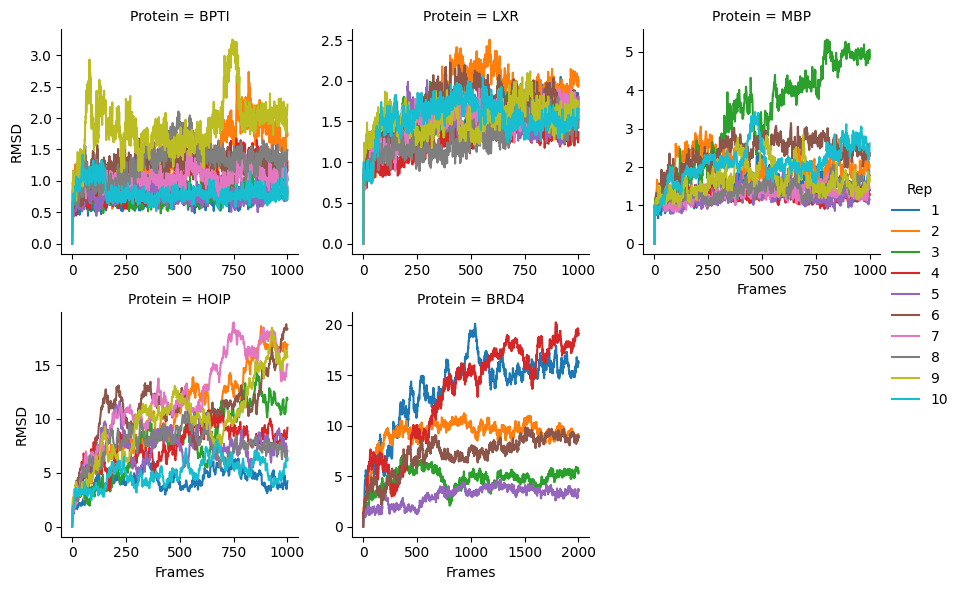

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt
# facet grid of RMSD against frames for each protein
plt.figure(figsize=(20, 10))
g = sns.FacetGrid(RMSD_df, col="Protein", hue="Rep", col_wrap=3, sharex=False, sharey=False)

g.map(sns.lineplot, "Frames", "RMSD")

g.add_legend()
# plt.yscale("log")
# plt.ylim(0.5,20)
# plt.xlim(0, 1000)

plt.show()
plt.close()

<Figure size 2000x1000 with 0 Axes>

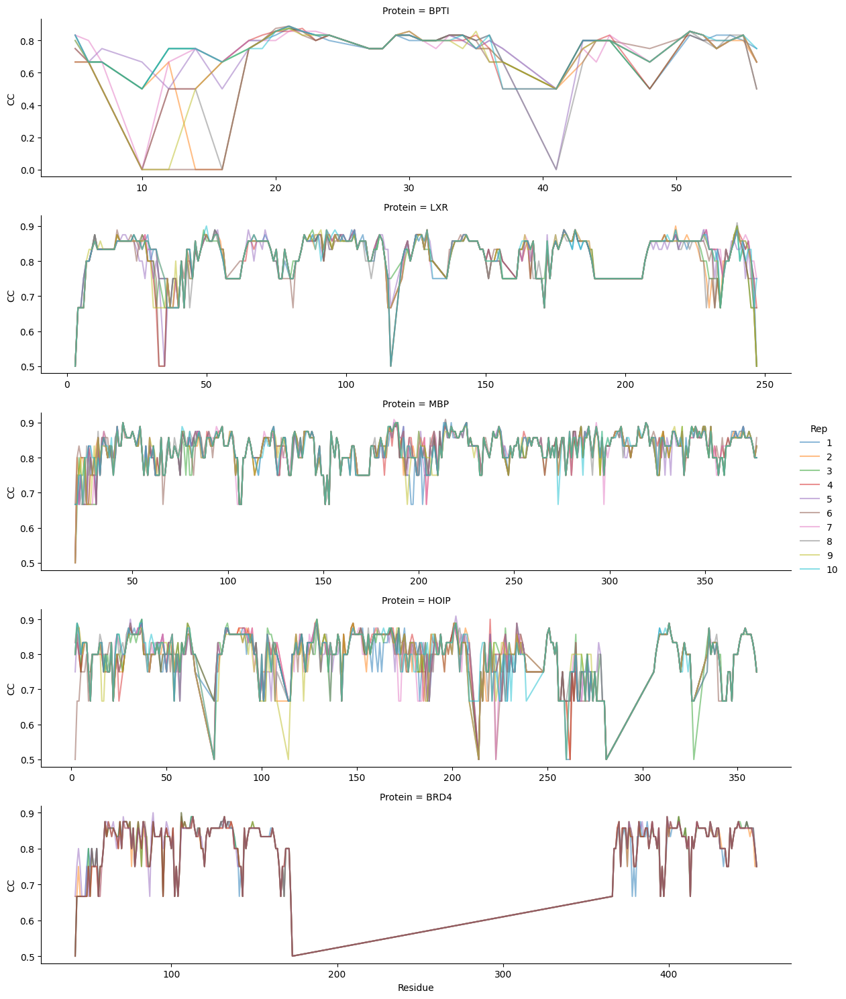

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt
# facet grid of RMSD against frames for each protein
plt.figure(figsize=(20, 10))
g = sns.FacetGrid(CC_df, col="Protein", hue="Rep", col_wrap=1, sharex=False, sharey=False, aspect=4)

g.map(sns.lineplot, "Residue", "CC", alpha=0.5)

g.add_legend()
# plt.yscale("log")
# plt.ylim(0.5,20)
# plt.xlim(0, 1000)

plt.show()
plt.close()

In [16]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA

def calculate_pca(universes, num_components=2, residues:list=None, ref_frame_index:int=0):
    sel = "protein and name CA"
    if residues is not None:
        resi_sel = " or ".join([f" resid {res}" for res in residues])
        sel = sel + f" and ({resi_sel})"

    # n_reps = len(universes)
    lengths = [len(u.trajectory) for u in universes]
    n_frames_total = sum(lengths)

    n_residues = len(universes[0].select_atoms(sel).residues)

    calc_intra_residue_dist = np.zeros((n_frames_total, n_residues*(n_residues-1)//2))

    counter = 0
    for r, universe in enumerate(universes):
        n_frames_per_rep = len(universe.trajectory)

        print(r)
        universe.trajectory[ref_frame_index]
        ref = universe.select_atoms(sel)
        # alignment = mda.analysis.align.AlignTraj(universe, ref, select=sel, in_memory=True).run()

        for i, ts in enumerate(universe.trajectory):
            print(r,i, end="\r")
            coords = ref.positions
            # calc_intra_residue_dist[r*n_frames_per_rep + i] = pdist(coords)
            calc_intra_residue_dist[counter] = pdist(coords)
            counter += 1
            
    pca = PCA(n_components=num_components)
    pca.fit(calc_intra_residue_dist[::10])
    data = pca.transform(calc_intra_residue_dist)

    return data

pca_df = pd.DataFrame()
n_dims = 2

for protein, d in proteins.items():
    print(protein)

    n_reps = len(d["traj_files"])

    _EQ_universes = EQ_universes[protein]
    _EQ_universes = [u[0] for u in _EQ_universes]
    print(len(_EQ_universes))
    print(type(_EQ_universes[0]))

    _universes = [mda.Universe(top, traj) for top, traj in zip(d["top_files"], d["traj_files"])]
    print(len(_universes))
    print(type(_universes[0]))

    af_universe = AF_clean_universes[protein]
    print(af_universe)


    universes = _universes + _EQ_universes + [af_universe]
    print(len(universes))

    res = d["Residues"]

    pca_data = calculate_pca(universes=universes, num_components=n_dims, ref_frame_index=0, residues=res)

    

    lengths = [len(u.trajectory) for u in universes[:-1]]

    reps = list(range(len(_universes)))+list(range(len(_EQ_universes)))+[0]

    frames = [list(range(l)) for l in lengths]

    frames = [item for sublist in frames for item in sublist]


    flags = ["GoodMD"]*len(_universes) + ["BadMD"]*len(_EQ_universes)

    flags = np.repeat(flags, lengths)

    plddts = EQ_proteins[protein]["plddts"]
    indexes = frames + [0]*len(af_universe.trajectory)
    frames = frames + list(range(len(af_universe.trajectory),0,-1))

    lengths = lengths + [len(af_universe.trajectory)]

    flags = list(flags) + ["cleanAF"]*len(af_universe.trajectory)
    print(len(reps))
    reps = np.repeat(reps, lengths)

    # reps = list(reps) + [0]*len(af_universe.trajectory)

    assert len(pca_data) == sum(lengths) == len(reps) == len(frames) == len(flags) == len(indexes), f"Lengths do not match {len(pca_data)} {sum(lengths)} {len(reps)} {len(frames)} {len(flags)} {len(indexes)}"


    df_to_add = pd.DataFrame({
        "PC1": pca_data[:, 0],
        "PC2": pca_data[:, 1],
        "Frames": frames,
        "Index": indexes,
        "Rep": reps,
        "Ensemble": flags,
        "Protein": [protein]*len(pca_data)
    })

    pca_df = pd.concat([pca_df, df_to_add])

BPTI
5
<class 'MDAnalysis.core.universe.Universe'>
10
<class 'MDAnalysis.core.universe.Universe'>
<Universe with 506 atoms>
16
0
1 1000
2 1000
3 1000
4 1000
5 1000
6 1000
7 1000
8 1000
9 1000
101000
11 3001
12 3001
13 3001
14 3001
15 3001
16 11818
LXR
5
<class 'MDAnalysis.core.universe.Universe'>
10
<class 'MDAnalysis.core.universe.Universe'>
<Universe with 2249 atoms>
16
0
1 1000
2 1000
3 1000
4 1000
5 1000
6 1000
7 1000
8 1000
9 1000
101000
11 3001
12 3001
13 3001
14 3001
15 3001
16 11570
MBP
5
<class 'MDAnalysis.core.universe.Universe'>
10
<class 'MDAnalysis.core.universe.Universe'>
<Universe with 3436 atoms>
16
0
1 1000
2 1000
3 1000
4 1000
5 1000
6 1000
7 1000
8 1000
9 1000
101000
11 3001
12 3001
13 3001
14 3001
15 3001
16 11132
HOIP
5
<class 'MDAnalysis.core.universe.Universe'>
10
<class 'MDAnalysis.core.universe.Universe'>
<Universe with 3369 atoms>
16
0
1 1000
2 1000
3 1000
4 1000
5 1000
6 1000
7 1000
8 1000
9 1000
101000
11 3001
12 3001
13 3001
14 3001
15 3001
16 10100
BRD4
5


In [91]:
from MDAnalysis.analysis import distances
import pandas as pd
import numpy as np
from scipy.spatial.distance import pdist, squareform
import MDAnalysis as mda

CC_df = pd.DataFrame()

def calculate_cc(universe, residues):
    select_str = "protein and name CA"
    select_str += " and (resid " + " ".join([str(res) for res in residues]) + ")"
    ca_atoms = universe.select_atoms(select_str)
    n_residues = len(ca_atoms)
    n_frames = len(universe.trajectory)
    
    pairwise_distances = np.zeros((n_frames, n_residues, n_residues))
    
    for i, ts in enumerate(universe.trajectory):
        pairwise_distances[i] = squareform(pdist(ca_atoms.positions))
    
    cc = np.zeros((n_residues, n_residues))
    for i in range(n_residues):
        for j in range(i+1, n_residues):
            corr_matrix = np.corrcoef(pairwise_distances[:, i, j], pairwise_distances[:, j, i])
            cc[i, j] = cc[j, i] = corr_matrix[0, 1]
    
    avg_pairwise_distances = np.mean(pairwise_distances, axis=0)
    mask = avg_pairwise_distances <= 7.4
    masked_cc = np.ma.array(cc, mask=~mask)
    flat_cc = np.sum(masked_cc, axis=1).data/np.sum(mask, axis=1)
    
    return flat_cc

for protein, d in proteins.items():
    print(f"Processing protein: {protein}")
    

    
    _EQ_universes = EQ_universes[protein]
    _EQ_universes = [u[0] for u in _EQ_universes]
    print(len(_EQ_universes))
    print(type(_EQ_universes[0]))

    _universes = [mda.Universe(top, traj) for top, traj in zip(d["top_files"], d["traj_files"])]
    print(len(_universes))
    print(type(_universes[0]))

    af_universe = AF_clean_universes[protein]
    print(af_universe)


    universes = _universes + _EQ_universes + [af_universe]

    # Process _universes
    for r, universe in enumerate(_universes):
        print(f" Processing _universe {r+1}")
        flat_cc = calculate_cc(universe, d["Residues"])
        df_to_add = pd.DataFrame({
            "CC": flat_cc,
            "Residue": d["Residues"],
            "Rep": [r+1] * len(d["Residues"]),
            "Protein": [protein] * len(d["Residues"]),
            "Ensemble": ["GoodMD"] * len(d["Residues"])
        })
        CC_df = pd.concat([CC_df, df_to_add], ignore_index=True)
    
    # Process _EQ_universes
    for r, universe in enumerate(_EQ_universes):
        print(f" Processing _EQ_universe {r+1}")
        flat_cc = calculate_cc(universe, d["Residues"])
        df_to_add = pd.DataFrame({
            "CC": flat_cc,
            "Residue": d["Residues"],
            "Rep": [r+1] * len(d["Residues"]),
            "Protein": [protein] * len(d["Residues"]),
            "Ensemble": ["BadMD"] * len(d["Residues"])
        })
        CC_df = pd.concat([CC_df, df_to_add], ignore_index=True)
    
    # Process AF_clean_universes
    print(" Processing AF_clean_universe")
    af_universe = AF_clean_universes[protein]
    flat_cc = calculate_cc(af_universe, d["Residues"])
    df_to_add = pd.DataFrame({
        "CC": flat_cc,
        "Residue": d["Residues"],
        "Rep": [1] * len(d["Residues"]),
        "Protein": [protein] * len(d["Residues"]),
        "Ensemble": ["cleanAF"] * len(d["Residues"])
    })
    CC_df = pd.concat([CC_df, df_to_add], ignore_index=True)

    # process the dirty universes
    print(" Processing dirty universe")
    dirty_universe = dirty_universes[protein]
    flat_cc = calculate_cc(dirty_universe, d["Residues"])
    df_to_add = pd.DataFrame({
        "CC": flat_cc,
        "Residue": d["Residues"],
        "Rep": [1] * len(d["Residues"]),
        "Protein": [protein] * len(d["Residues"]),
        "Ensemble": ["dirty"] * len(d["Residues"])
    })
    CC_df = pd.concat([CC_df, df_to_add], ignore_index=True)

print(CC_df)




Processing protein: BPTI
5
<class 'MDAnalysis.core.universe.Universe'>
10
<class 'MDAnalysis.core.universe.Universe'>
<Universe with 506 atoms>
 Processing _universe 1
 Processing _universe 2
 Processing _universe 3
 Processing _universe 4
 Processing _universe 5
 Processing _universe 6
 Processing _universe 7
 Processing _universe 8
 Processing _universe 9
 Processing _universe 10
 Processing _EQ_universe 1
 Processing _EQ_universe 2
 Processing _EQ_universe 3
 Processing _EQ_universe 4
 Processing _EQ_universe 5
 Processing AF_clean_universe
 Processing dirty universe
Processing protein: LXR
5
<class 'MDAnalysis.core.universe.Universe'>
10
<class 'MDAnalysis.core.universe.Universe'>
<Universe with 2249 atoms>
 Processing _universe 1
 Processing _universe 2
 Processing _universe 3
 Processing _universe 4
 Processing _universe 5
 Processing _universe 6
 Processing _universe 7
 Processing _universe 8
 Processing _universe 9
 Processing _universe 10
 Processing _EQ_universe 1
 Processing

KeyboardInterrupt: 

In [83]:
mean_CC = CC_df.groupby(["Protein", "Residue", "Ensemble"])["CC"].mean().reset_index()

In [84]:
mean_CC.CC.describe()

count    4.424000e+03
mean     1.000000e+00
std      1.660999e-17
min      1.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      1.000000e+00
max      1.000000e+00
Name: CC, dtype: float64

In [85]:
# set CC to bfactors and save the pdb file

for protein, d in EQ_proteins.items():

    top = d["af"]

    u = mda.Universe(top)

    for residue, cc in zip(mean_CC["Residue"], mean_CC["CC"]):
        print(residue, cc)
        u.select_atoms(f"resid {residue}").bfactors = cc

    save_path = top.replace(".pdb", "_CC.pdb")

    u.atoms.write(save_path)

/homes/hussain/hussain-simulation_hdx/programs/miniconda3/envs/p310_MDA/lib/python3.10/site-packages/MDAnalysis/coordinates/PDB.py:453: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn("1 A^3 CRYST1 record,"
/homes/hussain/hussain-simulation_hdx/programs/miniconda3/envs/p310_MDA/lib/python3.10/site-packages/MDAnalysis/core/topologyattrs.py:295: DeprecationWarning: The bfactor topology attribute is only provided as an alias to the tempfactor attribute. It will be removed in 3.0. Please use the tempfactor attribute instead.
  warnings.warn(BFACTOR_WARNING, DeprecationWarning)


5 1.0
5 1.0
5 1.0
5 1.0
6 1.0
6 1.0
6 1.0
6 1.0
7 1.0
7 1.0
7 1.0
7 1.0
10 1.0
10 1.0
10 0.9999999999999999
10 1.0
12 1.0
12 1.0
12 1.0
12 1.0
14 1.0
14 1.0
14 1.0
14 1.0
16 1.0
16 1.0
16 1.0
16 1.0
18 1.0
18 1.0
18 1.0
18 1.0
19 1.0
19 1.0
19 1.0
19 1.0
20 1.0
20 1.0
20 1.0
20 1.0
21 1.0
21 1.0
21 1.0
21 1.0
22 1.0
22 1.0
22 1.0
22 1.0
23 1.0
23 1.0
23 1.0
23 1.0
24 1.0
24 1.0
24 1.0
24 1.0
27 1.0
27 1.0
27 1.0
27 1.0
28 1.0
28 1.0
28 1.0
28 1.0
29 1.0
29 1.0
29 1.0
29 1.0
30 1.0
30 1.0
30 1.0
30 1.0
31 1.0
31 1.0
31 1.0
31 1.0
32 1.0
32 1.0
32 1.0
32 1.0
33 1.0
33 1.0
33 1.0
33 1.0
34 1.0
34 1.0
34 1.0
34 1.0
35 1.0
35 1.0
35 1.0
35 1.0
36 1.0
36 1.0
36 1.0
36 1.0
37 1.0
37 1.0
37 1.0
37 1.0
41 1.0
41 1.0
41 1.0
41 0.9999999999999999
43 1.0
43 1.0
43 1.0
43 1.0
44 1.0
44 1.0
44 1.0
44 1.0
45 1.0
45 1.0
45 1.0
45 1.0
48 1.0
48 1.0
48 1.0
48 1.0
51 1.0
51 1.0
51 1.0
51 1.0
52 1.0
52 1.0
52 1.0
52 1.0
53 1.0
53 1.0
53 1.0
53 1.0
54 1.0
54 1.0
54 1.0
54 1.0
55 1.0
55 1.0
55 1.0
55 1.0
56

/homes/hussain/hussain-simulation_hdx/programs/miniconda3/envs/p310_MDA/lib/python3.10/site-packages/MDAnalysis/coordinates/PDB.py:777: UserWarning: Unit cell dimensions not found. CRYST1 record set to unitary values.
  warnings.warn("Unit cell dimensions not found. "
/homes/hussain/hussain-simulation_hdx/programs/miniconda3/envs/p310_MDA/lib/python3.10/site-packages/MDAnalysis/coordinates/PDB.py:1153: UserWarning: Found no information for attr: 'formalcharges' Using default value of '0'
  warnings.warn("Found no information for attr: '{}'"


5 1.0
5 1.0
5 1.0
5 1.0
6 1.0
6 1.0
6 1.0
6 1.0
7 1.0
7 1.0
7 1.0
7 1.0
10 1.0
10 1.0
10 0.9999999999999999
10 1.0
12 1.0
12 1.0
12 1.0
12 1.0
14 1.0
14 1.0
14 1.0
14 1.0
16 1.0
16 1.0
16 1.0
16 1.0
18 1.0
18 1.0
18 1.0
18 1.0
19 1.0
19 1.0
19 1.0
19 1.0
20 1.0
20 1.0
20 1.0
20 1.0
21 1.0
21 1.0
21 1.0
21 1.0
22 1.0
22 1.0
22 1.0
22 1.0
23 1.0
23 1.0
23 1.0
23 1.0
24 1.0
24 1.0
24 1.0
24 1.0
27 1.0
27 1.0
27 1.0
27 1.0
28 1.0
28 1.0
28 1.0
28 1.0
29 1.0
29 1.0
29 1.0
29 1.0
30 1.0
30 1.0
30 1.0
30 1.0
31 1.0
31 1.0
31 1.0
31 1.0
32 1.0
32 1.0
32 1.0
32 1.0
33 1.0
33 1.0
33 1.0
33 1.0
34 1.0
34 1.0
34 1.0
34 1.0
35 1.0
35 1.0
35 1.0
35 1.0
36 1.0
36 1.0
36 1.0
36 1.0
37 1.0
37 1.0
37 1.0
37 1.0
41 1.0
41 1.0
41 1.0
41 0.9999999999999999
43 1.0
43 1.0
43 1.0
43 1.0
44 1.0
44 1.0
44 1.0
44 1.0
45 1.0
45 1.0
45 1.0
45 1.0
48 1.0
48 1.0
48 1.0
48 1.0
51 1.0
51 1.0
51 1.0
51 1.0
52 1.0
52 1.0
52 1.0
52 1.0
53 1.0
53 1.0
53 1.0
53 1.0
54 1.0
54 1.0
54 1.0
54 1.0
55 1.0
55 1.0
55 1.0
55 1.0
56

In [86]:

for protein, d in proteins.items():
    print(f"Processing protein: {protein}")
    

    
    _EQ_universes = EQ_universes[protein]
    _EQ_universes = [u[0] for u in _EQ_universes]
    # print(len(_EQ_universes))
    # print(type(_EQ_universes[0]))

    _universes = [mda.Universe(top, traj) for top, traj in zip(d["top_files"], d["traj_files"])]
    # print(len(_universes))
    # print(type(_universes[0]))

    af_universe = AF_clean_universes[protein]
    # print(af_universe)


    universes = _universes + _EQ_universes + [af_universe]

    _universe = universes[0]

    # select the mean CC for the ensemble and protein
    mean_LCC = mean_CC[mean_CC["Ensemble"] == "GoodMD"]
    mean_LCC = mean_LCC[mean_LCC["Protein"] == protein]

    # set the b factors to zero
    _universe.atoms.bfactors = 0


    for residue, cc in zip(mean_LCC["Residue"], mean_LCC["CC"]):
        _universe.select_atoms(f"resid {residue}").bfactors = cc

    save_path = d["top_files"][0].replace(".pdb", "_GoodMD_CC.pdb")
    print(save_path)
    _universe.atoms.write(save_path)


    _EQ_universe = _EQ_universes[0]

    _EQ_universe.atoms.bfactors = 0

    mean_LCC = mean_CC[mean_CC["Ensemble"] == "BadMD"]
    mean_LCC = mean_LCC[mean_LCC["Protein"] == protein]

    for residue, cc in zip(mean_LCC["Residue"], mean_LCC["CC"]):
        _EQ_universe.select_atoms(f"resid {residue}").bfactors = cc

    save_path = d["top_files"][0].replace(".pdb", "_BadMD_CC.pdb")
    print(save_path)

    _EQ_universe.atoms.write(save_path)



    # Process AF_clean_universes
    print(" Processing AF_clean_universe")
    af_universe = AF_clean_universes[protein]

    af_universe.atoms.bfactors = 0

    mean_LCC = mean_CC[mean_CC["Ensemble"] == "cleanAF"]
    mean_LCC = mean_LCC[mean_LCC["Protein"] == protein]

    for residue, cc in zip(mean_LCC["Residue"], mean_LCC["CC"]):
        # print(residue, cc)
        af_universe.select_atoms(f"resid {residue}").bfactors = cc


    save_path = d["top_files"][0].replace(".pdb", "_AFclean_CC.pdb")
    print(save_path)

    af_universe.atoms.write(save_path)



    # process the dirty universes
    print(" Processing dirty universe")
    dirty_universe = dirty_universes[protein]

    dirty_universe.atoms.bfactors = 0

    mean_LCC = mean_CC[mean_CC["Ensemble"] == "dirty"]
    mean_LCC = mean_LCC[mean_LCC["Protein"] == protein]



    for residue, cc in zip(mean_LCC["Residue"], mean_LCC["CC"]):
        dirty_universe.select_atoms(f"resid {residue}").bfactors = cc

    save_path = d["top_files"][0].replace(".pdb", "_AFdirty_CC.pdb")
    print(save_path)
    dirty_universe.atoms.write(save_path)



    BadMD_mean_LCC = mean_CC[mean_CC["Ensemble"] == "BadMD"]
    BadMD_mean_LCC = BadMD_mean_LCC[BadMD_mean_LCC["Protein"] == protein]

    clean_AF_mean_LCC = mean_CC[mean_CC["Ensemble"] == "cleanAF"]
    clean_AF_mean_LCC = clean_AF_mean_LCC[clean_AF_mean_LCC["Protein"] == protein]

    delta_cc = BadMD_mean_LCC["CC"].values - clean_AF_mean_LCC["CC"].values
    residues = BadMD_mean_LCC["Residue"].values

    for residue, cc in zip(residues, delta_cc):
        print(residue, cc)
        af_universe.select_atoms(f"resid {residue}").bfactors = np.abs(cc)

    save_path = d["top_files"][0].replace(".pdb", "_deltaBadMD-cleanAF_CC.pdb")

    af_universe.atoms.write(save_path)

    


print(CC_df)




Processing protein: BPTI
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c0/R_1/APO_md_P00974_60_6-nojump_GoodMD_CC.pdb
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c0/R_1/APO_md_P00974_60_6-nojump_BadMD_CC.pdb


/homes/hussain/hussain-simulation_hdx/programs/miniconda3/envs/p310_MDA/lib/python3.10/site-packages/MDAnalysis/coordinates/PDB.py:1200: UserWarning: Found missing chainIDs. Corresponding atoms will use value of 'X'
  warnings.warn("Found missing chainIDs."


 Processing AF_clean_universe
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c0/R_1/APO_md_P00974_60_6-nojump_AFclean_CC.pdb
 Processing dirty universe
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/P00974_60/BPTI_10_c0/R_1/APO_md_P00974_60_6-nojump_AFdirty_CC.pdb
5 0.0
6 0.0
7 0.0
10 1.1102230246251565e-16
12 0.0
14 0.0
16 0.0
18 0.0
19 0.0
20 0.0
21 0.0
22 0.0
23 0.0
24 0.0
27 0.0
28 0.0
29 0.0
30 0.0
31 0.0
32 0.0
33 0.0
34 0.0
35 0.0
36 0.0
37 0.0
41 0.0
43 0.0
44 0.0
45 0.0
48 0.0
51 0.0
52 0.0
53 0.0
54 0.0
55 0.0
56 0.0
Processing protein: LXR
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/LXRa/LXR_10_c0/R_1/APO_md_LXRa_6-nojump_GoodMD_CC.pdb
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/LXRa/LXR_10_c0/R_1/APO_md_LXRa_6-nojump_BadMD_CC.pdb
 Processing AF_clean_universe
/homes/hussain/hussain-simulation_hdx/projects/xMD/data/MD/LXRa/LXR_10_c0/R_1/APO_md_LXRa_6-nojump_AFclean_CC.pdb
 Processing dirty universe
/home

<Figure size 2000x1000 with 0 Axes>

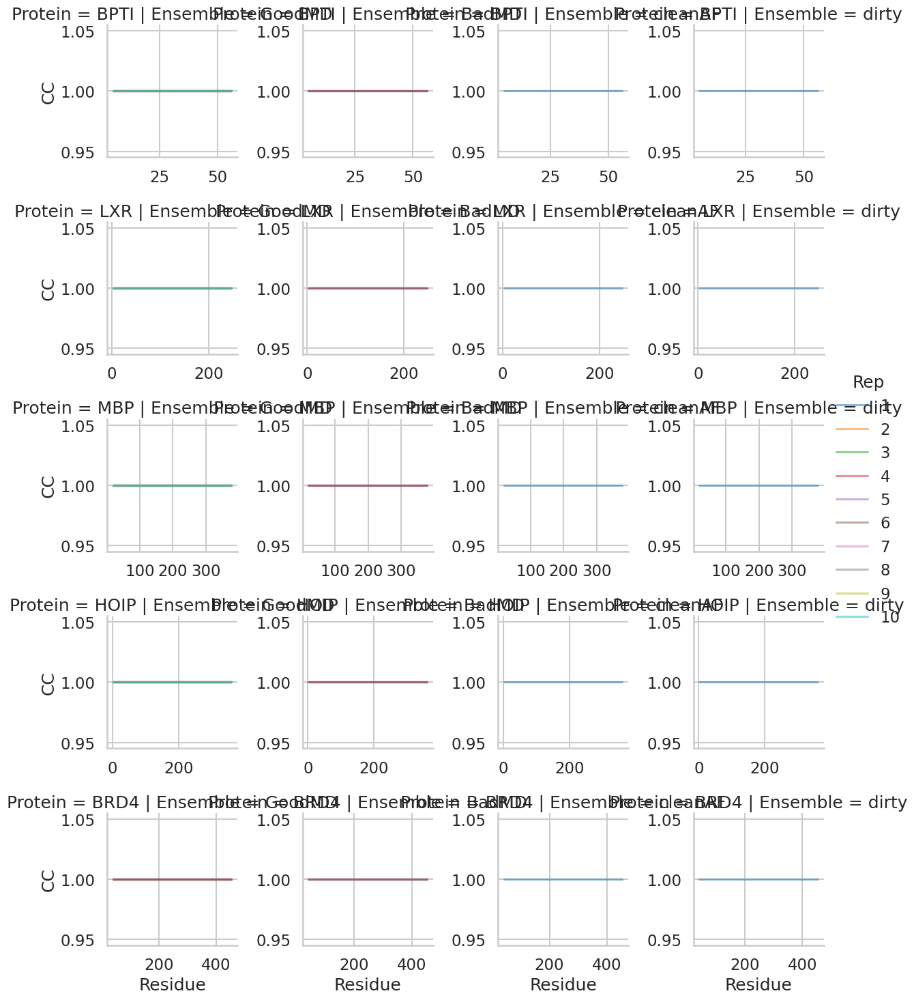

In [87]:
import seaborn as sns
import matplotlib.pyplot as plt
# facet grid of RMSD against frames for each protein
plt.figure(figsize=(20, 10))
g = sns.FacetGrid(CC_df, row="Protein", col="Ensemble", hue="Rep", sharex=False, sharey=False)

g.map(sns.lineplot, "Residue", "CC", alpha=0.5)

g.add_legend()
# plt.yscale("log")
# plt.ylim(0.5,20)
# plt.xlim(0, 1000)

plt.show()
plt.close()

<Figure size 2000x1000 with 0 Axes>

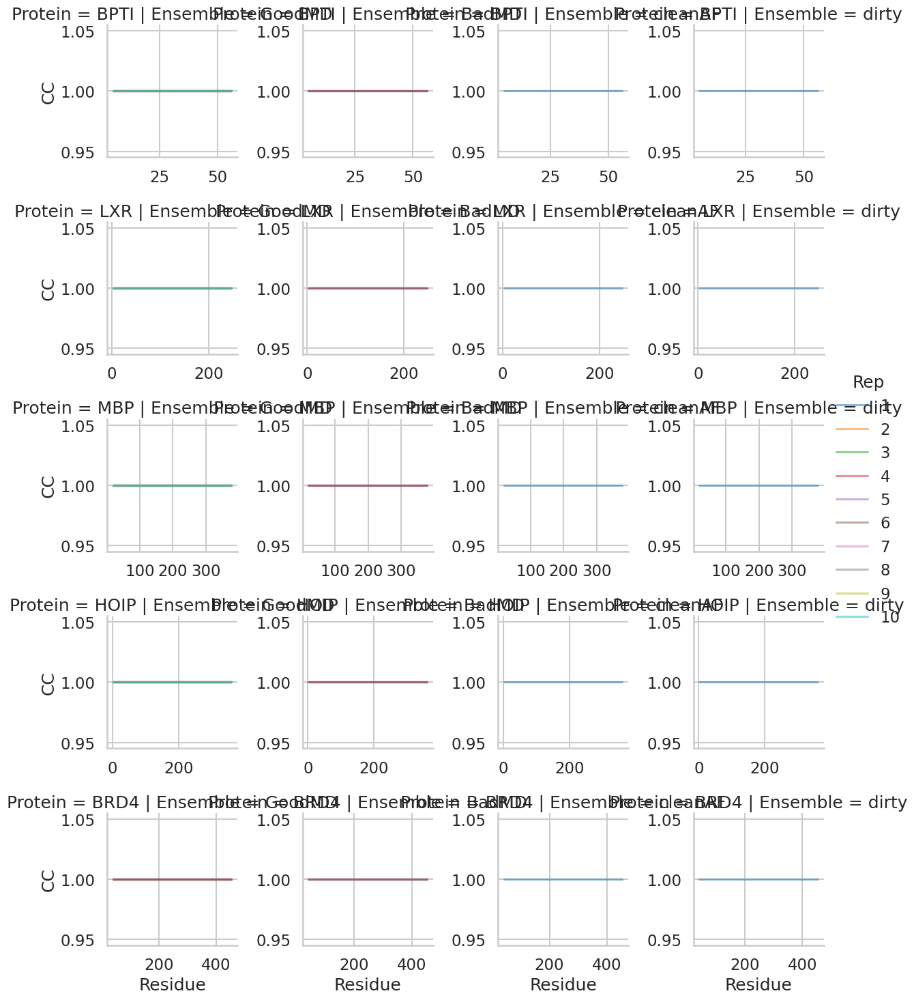

In [88]:
import seaborn as sns
import matplotlib.pyplot as plt
# facet grid of RMSD against frames for each protein
plt.figure(figsize=(20, 10))
g = sns.FacetGrid(CC_df, row="Protein", col="Ensemble", hue="Rep", sharex=False, sharey=False)

g.map(sns.lineplot, "Residue", "CC", alpha=0.5)

g.add_legend()
# plt.yscale("log")
# plt.ylim(0.5,20)
# plt.xlim(0, 1000)

plt.show()
plt.close()

/homes/hussain/hussain-simulation_hdx/programs/miniconda3/envs/p310_MDA/lib/python3.10/site-packages/seaborn/axisgrid.py:854: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(*plot_args, **plot_kwargs)
/homes/hussain/hussain-simulation_hdx/programs/miniconda3/envs/p310_MDA/lib/python3.10/site-packages/seaborn/axisgrid.py:854: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(*plot_args, **plot_kwargs)


<Figure size 1000x1000 with 0 Axes>

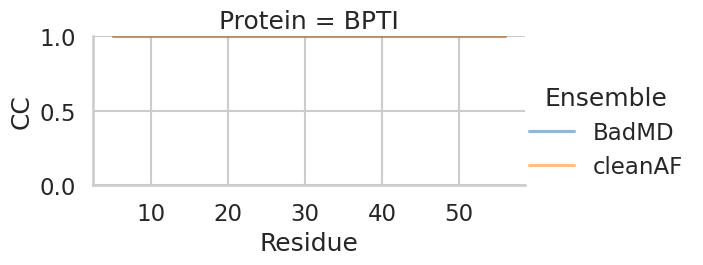

In [89]:
import seaborn as sns
import matplotlib.pyplot as plt
# facet grid of RMSD against frames for each protein
plt.figure(figsize=(10, 10))

sns.set_context("talk")
sns.set_style("whitegrid")

g = sns.FacetGrid(CC_df, row="Protein", hue="Ensemble", sharex=False, sharey=False, aspect=2,hue_order=[ "BadMD", "cleanAF"], height=3, row_order=["BPTI"])

g.map(sns.lineplot, "Residue", "CC", alpha=0.5, palette="Set2")

g.add_legend()
# plt.yscale("log")
plt.ylim(0,1)
# plt.xlim(0, 1000)

plt.show()
plt.close()

/homes/hussain/hussain-simulation_hdx/programs/miniconda3/envs/p310_MDA/lib/python3.10/site-packages/seaborn/axisgrid.py:854: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(*plot_args, **plot_kwargs)


/homes/hussain/hussain-simulation_hdx/programs/miniconda3/envs/p310_MDA/lib/python3.10/site-packages/seaborn/axisgrid.py:854: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(*plot_args, **plot_kwargs)


<Figure size 1000x1000 with 0 Axes>

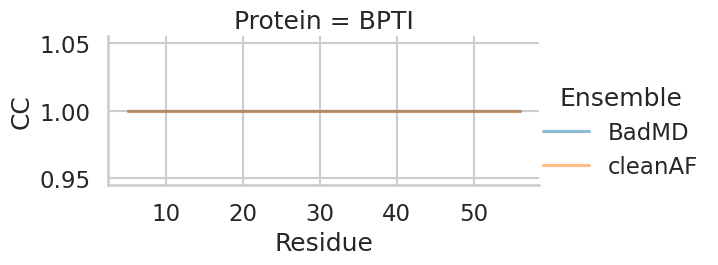

In [90]:
import seaborn as sns
import matplotlib.pyplot as plt
# facet grid of RMSD against frames for each protein
plt.figure(figsize=(10, 10))

sns.set_context("talk")
sns.set_style("whitegrid")

g = sns.FacetGrid(CC_df, row="Protein", hue="Ensemble", sharex=False, sharey=False, aspect=2,hue_order=[ "BadMD", "cleanAF"], height=3, row_order=["BPTI"])

g.map(sns.lineplot, "Residue", "CC", alpha=0.5, palette="Set2")

g.add_legend()
# plt.yscale("log")
# plt.ylim(0.5,20)
# plt.xlim(0, 1000)

plt.show()
plt.close()

/homes/hussain/hussain-simulation_hdx/programs/miniconda3/envs/p310_MDA/lib/python3.10/site-packages/seaborn/axisgrid.py:854: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(*plot_args, **plot_kwargs)
/homes/hussain/hussain-simulation_hdx/programs/miniconda3/envs/p310_MDA/lib/python3.10/site-packages/seaborn/axisgrid.py:854: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(*plot_args, **plot_kwargs)
/homes/hussain/hussain-simulation_hdx/programs/miniconda3/envs/p310_MDA/lib/python3.10/site-packages/seaborn/axisgrid.py:854: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(*plot_args, **plot_kwargs)
/homes/hussain/hussain-simulation_hdx/programs/miniconda3/envs/p310_MDA/lib/python3.10/site-packages/seaborn/axisgrid.py:854: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(*plot_args, **plot_kwargs)
/homes/hussain/hussain-simulation_hdx/programs/minic

<Figure size 1000x1000 with 0 Axes>

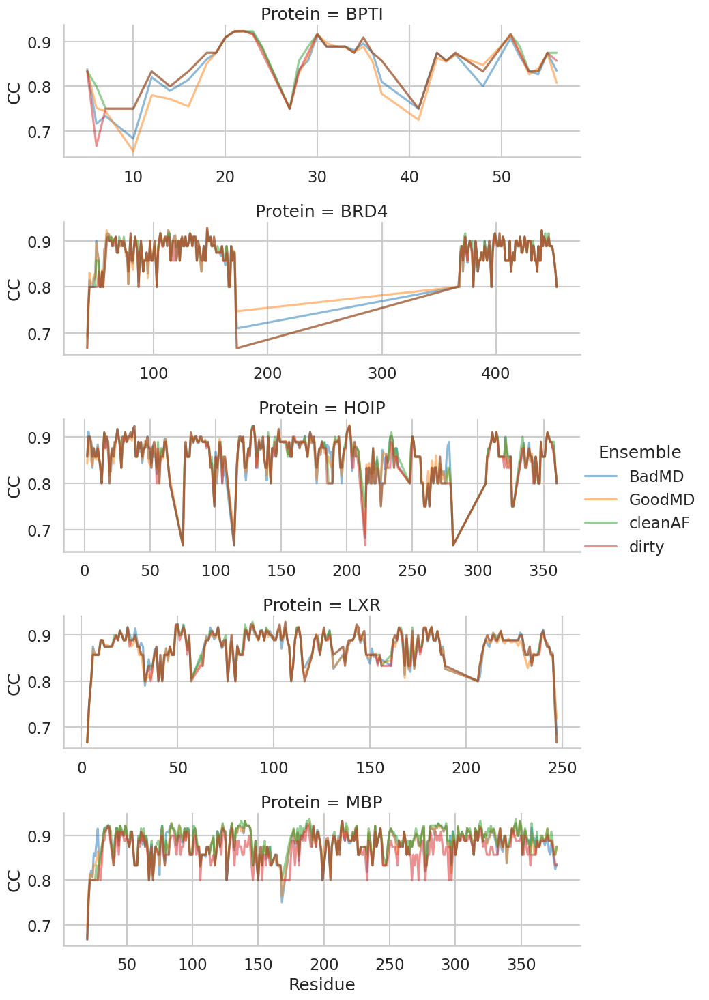

In [61]:
import seaborn as sns
import matplotlib.pyplot as plt
# facet grid of RMSD against frames for each protein
plt.figure(figsize=(10, 10))

sns.set_context("talk")
sns.set_style("whitegrid")

g = sns.FacetGrid(mean_CC, row="Protein", hue="Ensemble", sharex=False, sharey=False, aspect=3)

g.map(sns.lineplot, "Residue", "CC", alpha=0.5, palette="tab10")

g.add_legend()
# plt.yscale("log")
# plt.ylim(0.5,20)
# plt.xlim(0, 1000)

plt.show()
plt.close()

In [62]:
# import pandas as pd
# import numpy as np
# from scipy.spatial.distance import pdist
# import phate

# def calculate_phate(universes, n_components=2, residues:list=None, ref_frame_index:int=0):
#     sel = "protein and name CA"
#     if residues is not None:
#         resi_sel = " or ".join([f" resid {res}" for res in residues])
#         sel = sel + f" and ({resi_sel})"
    
#     lengths = [len(u.trajectory) for u in universes]
#     n_frames_total = sum(lengths)
#     n_residues = len(universes[0].select_atoms(sel).residues)
#     calc_intra_residue_dist = np.zeros((n_frames_total, n_residues*(n_residues-1)//2))
    
#     counter = 0
#     for r, universe in enumerate(universes):
#         n_frames_per_rep = len(universe.trajectory)
#         print(r)
#         universe.trajectory[ref_frame_index]
#         ref = universe.select_atoms(sel)
        
#         for i, ts in enumerate(universe.trajectory):
#             print(r, i, end="\r")
#             coords = ref.positions
#             calc_intra_residue_dist[counter] = pdist(coords)
#             counter += 1
    
#     phate_operator = phate.PHATE(n_components=n_components, random_state=42)
#     phate_fit = phate_operator.fit(calc_intra_residue_dist[::5])
#     data = phate_operator.transform(calc_intra_residue_dist)
#     return data

# phate_df = pd.DataFrame()
# n_dims = 2

# for protein, d in proteins.items():
#     print(protein)
#     n_reps = len(d["traj_files"])
#     _EQ_universes = EQ_universes[protein]
#     _EQ_universes = [u[0] for u in _EQ_universes]
#     print(len(_EQ_universes))
#     print(type(_EQ_universes[0]))
#     _universes = [mda.Universe(top, traj) for top, traj in zip(d["top_files"], d["traj_files"])]
#     print(len(_universes))
#     print(type(_universes[0]))
#     af_universe = AF_clean_universes[protein]
#     print(af_universe)
#     universes = _universes + _EQ_universes
#     print(len(universes))
#     res = d["Residues"]
    
#     phate_data = calculate_phate(universes=universes, n_components=n_dims, ref_frame_index=0, residues=res)
    
#     lengths = [len(u.trajectory) for u in universes]
#     reps = list(range(len(_universes))) + list(range(len(_EQ_universes))) 
#     frames = [list(range(l)) for l in lengths]
#     frames = [item for sublist in frames for item in sublist]
#     flags = ["GoodMD"]*len(_universes) + ["BadMD"]*len(_EQ_universes)
#     flags = np.repeat(flags, lengths)
#     plddts = EQ_proteins[protein]["plddts"]
#     indexes = frames 
#     # frames = frames + list(range(len(af_universe.trajectory),0,-1))
#     # lengths = lengths + [len(af_universe.trajectory)]
#     # flags = list(flags) + ["cleanAF"]*len(af_universe.trajectory)
#     print(len(reps))
#     reps = np.repeat(reps, lengths)
    
#     assert len(phate_data) == sum(lengths) == len(reps) == len(frames) == len(flags) == len(indexes), f"Lengths do not match {len(phate_data)} {sum(lengths)} {len(reps)} {len(frames)} {len(flags)} {len(indexes)}"
    
#     df_to_add = pd.DataFrame({
#         "PHATE1": phate_data[:, 0],
#         "PHATE2": phate_data[:, 1],
#         "Frames": frames,
#         "Index": indexes,
#         "Rep": reps,
#         "Ensemble": flags,
#         "Protein": [protein]*len(phate_data)
#     })
    
#     phate_df = pd.concat([phate_df, df_to_add])

In [63]:
# phate_df

In [64]:
pca_df

,PC1,PC2,Frames,Index,Rep,Ensemble,Protein
0,-1.427853,0.712323,0,0,0,GoodMD,BPTI
1,-0.179725,-0.290670,1,1,0,GoodMD,BPTI
2,1.691232,2.015777,2,2,0,GoodMD,BPTI
3,-0.796955,2.893520,3,3,0,GoodMD,BPTI
4,1.100321,-3.457176,4,4,0,GoodMD,BPTI
...,...,...,...,...,...,...,...
37452,-502.846821,-44.441693,5,0,0,cleanAF,BRD4
37453,-187.040894,-821.585851,4,0,0,cleanAF,BRD4
37454,-427.618078,-26.894642,3,0,0,cleanAF,BRD4
37455,-400.567333,-439.857267,2,0,0,cleanAF,BRD4


In [65]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA

def calculate_pca(universes, num_components=2, residues:list=None, ref_frame_index:int=0):
    sel = "protein and name CA"
    if residues is not None:
        resi_sel = " or ".join([f" resid {res}" for res in residues])
        sel = sel + f" and ({resi_sel})"

    # n_reps = len(universes)
    lengths = [len(u.trajectory) for u in universes]
    n_frames_total = sum(lengths)

    n_residues = len(universes[0].select_atoms(sel).residues)

    calc_intra_residue_dist = np.zeros((n_frames_total, n_residues*(n_residues-1)//2))

    counter = 0
    for r, universe in enumerate(universes):
        n_frames_per_rep = len(universe.trajectory)

        print(r)
        universe.trajectory[ref_frame_index]
        ref = universe.select_atoms(sel)
        # alignment = mda.analysis.align.AlignTraj(universe, ref, select=sel, in_memory=True).run()

        for i, ts in enumerate(universe.trajectory):
            print(r,i, end="\r")
            coords = ref.positions
            # calc_intra_residue_dist[r*n_frames_per_rep + i] = pdist(coords)
            calc_intra_residue_dist[counter] = pdist(coords)
            counter += 1
            
    pca = PCA(n_components=num_components)
    pca.fit(calc_intra_residue_dist[::2])
    data = pca.transform(calc_intra_residue_dist)

    return data

BPTI_pca_df = pd.DataFrame()
n_dims = 2

for protein, d in proteins.items():
    if not protein == "BPTI":
        continue

    print(protein)

    n_reps = len(d["traj_files"])

    _EQ_universes = EQ_universes[protein]
    _EQ_universes = [u[0] for u in _EQ_universes]
    print(len(_EQ_universes))
    print(type(_EQ_universes[0]))

    _universes = [mda.Universe(top, traj) for top, traj in zip(d["top_files"], d["traj_files"])]
    print(len(_universes))
    print(type(_universes[0]))

    af_universe = AF_clean_universes[protein]
    print(af_universe)


    universes = _universes + _EQ_universes + [BPTI_shaw_universe] + [af_universe] 
    print(len(universes))

    res = d["Residues"]

    pca_data = calculate_pca(universes=universes, num_components=n_dims, ref_frame_index=0, residues=res)

    

    lengths = [len(u.trajectory) for u in universes[:-1]]

    reps = list(range(len(_universes)))+list(range(len(_EQ_universes)))+[0]+[0]

    frames = [list(range(l)) for l in lengths]

    frames = [item for sublist in frames for item in sublist]


    flags = ["GoodMD"]*len(_universes) + ["BadMD"]*len(_EQ_universes) + ["SHAW"]*len([BPTI_shaw_universe])

    flags = np.repeat(flags, lengths)

    plddts = EQ_proteins[protein]["plddts"]
    indexes = frames + [0]*len(af_universe.trajectory)
    frames = frames + list(range(len(af_universe.trajectory),0,-1))

    lengths = lengths + [len(af_universe.trajectory)]

    flags = list(flags) + ["cleanAF"]*len(af_universe.trajectory)
    print(len(reps))
    reps = np.repeat(reps, lengths)

    # reps = list(reps) + [0]*len(af_universe.trajectory)

    assert len(pca_data) == sum(lengths) == len(reps) == len(frames) == len(flags) == len(indexes), f"Lengths do not match {len(pca_data)} {sum(lengths)} {len(reps)} {len(frames)} {len(flags)} {len(indexes)}"


    df_to_add = pd.DataFrame({
        "PC1": pca_data[:, 0],
        "PC2": pca_data[:, 1],
        "Frames": frames,
        "Index": indexes,
        "Rep": reps,
        "Ensemble": flags,
        "Protein": [protein]*len(pca_data)
    })

    BPTI_pca_df = pd.concat([BPTI_pca_df, df_to_add])


    

BPTI
5
<class 'MDAnalysis.core.universe.Universe'>
10
<class 'MDAnalysis.core.universe.Universe'>
<Universe with 506 atoms>
17
0
1 1000
2 1000
3 1000
4 1000


5 1000
6 1000
7 1000
8 1000
9 1000
101000
11 3001
12 3001
13 3001
14 3001
15 3001
16 4124
17 11818


In [66]:
# import pandas as pd
# import numpy as np
# from sklearn.decomposition import PCA

# def calculate_pca(universes, num_components=2, residues:list=None, ref_frame_index:int=0):
#     sel = "protein and name CA"
#     if residues is not None:
#         resi_sel = " or ".join([f" resid {res}" for res in residues])
#         sel = sel + f" and ({resi_sel})"

#     n_reps = len(universes)
#     n_frames_per_rep = len(universes[0].trajectory)
#     n_frames_total = n_reps * n_frames_per_rep
#     n_residues = len(universes[0].select_atoms(sel))

#     calc_intra_residue_dist = np.zeros((n_frames_total, n_residues*(n_residues-1)//2))

#     for r, universe in enumerate(universes):
        
#         print(r)
#         universe.trajectory[ref_frame_index]
#         ref = universe.select_atoms(sel)
#         # alignment = mda.analysis.align.AlignTraj(universe, ref, select=sel, in_memory=True).run()

#         for i, ts in enumerate(universe.trajectory):
#             print(r,i, end="\r")
#             coords = ref.positions
#             calc_intra_residue_dist[r*n_frames_per_rep + i] = pdist(coords)

#     pca = PCA(n_components=num_components)
#     pca.fit(calc_intra_residue_dist)
#     data = pca.transform(calc_intra_residue_dist)

#     return data

# all_pca_df = pd.DataFrame()
# n_dims = 2

# for protein, d in proteins.items():
#     print(protein)

#     n_reps = len(d["traj_files"])

#     universes = [mda.Universe(top, traj) for top, traj in zip(d["top_files"], d["traj_files"])]

    
#     pca_data = calculate_pca(universes=universes, num_components=n_dims, ref_frame_index=0)

#     frames = np.tile(range(len(pca_data) // n_reps), n_reps)
#     reps = np.repeat(range(1, n_reps+1), len(pca_data) // n_reps)
#     print(frames)
#     print(reps)
#     # break

#     df_to_add = pd.DataFrame({
#         "PC1": pca_data[:, 0],
#         "PC2": pca_data[:, 1],
#         "Frames": frames,
#         "Rep": reps,
#         "Protein": [protein]*len(pca_data)
#     })

#     pca_df = pd.concat([pca_df, df_to_add])

In [67]:
# import pandas as pd
# import numpy as np
# from sklearn.manifold import TSNE
# from scipy.spatial.distance import pdist

# def calculate_tsne(universes, num_components=2, residues:list=None, ref_frame_index:int=0, perplexity=30, n_iter=1000):
#     sel = "protein and name CA"
#     if residues is not None:
#         resi_sel = " or ".join([f" resid {res}" for res in residues])
#         sel = sel + f" and ({resi_sel})"
    
#     lengths = [len(u.trajectory) for u in universes]
#     n_frames_total = sum(lengths)
#     n_residues = len(universes[0].select_atoms(sel).residues)
#     calc_intra_residue_dist = np.zeros((n_frames_total, n_residues*(n_residues-1)//2))
    
#     counter = 0
#     for r, universe in enumerate(universes):
#         n_frames_per_rep = len(universe.trajectory)
#         print(r)
#         universe.trajectory[ref_frame_index]
#         ref = universe.select_atoms(sel)
        
#         for i, ts in enumerate(universe.trajectory):
#             print(r, i, end="\r")
#             coords = ref.positions
#             calc_intra_residue_dist[counter] = pdist(coords)
#             counter += 1
    
#     # Perform t-SNE
#     tsne = TSNE(n_components=num_components, perplexity=perplexity, n_iter=n_iter, random_state=42)
#     data = tsne.fit_transform(calc_intra_residue_dist[::10])

#     return data

# tsne_df = pd.DataFrame()
# n_dims = 2

# for protein, d in proteins.items():
#     print(protein)
#     n_reps = len(d["traj_files"])
#     _EQ_universes = EQ_universes[protein]
#     _EQ_universes = [u[0] for u in _EQ_universes]
#     print(len(_EQ_universes))
#     print(type(_EQ_universes[0]))
#     _universes = [mda.Universe(top, traj) for top, traj in zip(d["top_files"], d["traj_files"])]
#     print(len(_universes))
#     print(type(_universes[0]))
#     af_universe = AF_clean_universes[protein]
#     print(af_universe)
#     universes = _universes + _EQ_universes + [af_universe]
#     print(len(universes))
#     res = d["Residues"]
    
#     tsne_data = calculate_tsne(universes=universes, num_components=n_dims, ref_frame_index=0, residues=res)
    
#     lengths = [len(u.trajectory) for u in universes[:-1]]
#     reps = list(range(len(_universes)))+list(range(len(_EQ_universes)))+[0]
#     frames = [list(range(l)) for l in lengths]
#     frames = [item for sublist in frames for item in sublist]
#     flags = ["GoodMD"]*len(_universes) + ["BadMD"]*len(_EQ_universes)
#     flags = np.repeat(flags, lengths)
#     plddts = EQ_proteins[protein]["plddts"][::10]
#     indexes = frames[::10] + ([0]*len(af_universe.trajectory))[::10]
#     frames = frames[::10] + list(range(len(af_universe.trajectory),0,-1))[::10]
#     lengths = lengths + [len(af_universe.trajectory)]
#     flags = list(flags[::10]) + (["cleanAF"]*len(af_universe.trajectory))[::10]
#     print(len(reps))
#     reps = np.repeat(reps, lengths)[::10]
    
#     assert len(tsne_data) == round(sum(lengths)/10,0) == len(reps) == len(frames) == len(flags) == len(indexes), f"Lengths do not match {len(tsne_data)} {sum(lengths)} {len(reps)} {len(frames)} {len(flags)} {len(indexes)}"
    
#     df_to_add = pd.DataFrame({
#         "TSNE1": tsne_data[:, 0],
#         "TSNE2": tsne_data[:, 1],
#         "Frames": frames,
#         "Index": indexes,
#         "Rep": reps,
#         "Ensemble": flags,
#         "Protein": [protein]*len(tsne_data)
#     })
    
#     tsne_df = pd.concat([tsne_df, df_to_add])

In [38]:
# import pandas as pd
# import numpy as np
# from umap import UMAP
# from scipy.spatial.distance import pdist

# def calculate_umap(universes, num_components=2, residues:list=None, ref_frame_index:int=0, n_neighbors=15, min_dist=0.1):
#     sel = "protein and name CA"
#     if residues is not None:
#         resi_sel = " or ".join([f" resid {res}" for res in residues])
#         sel = sel + f" and ({resi_sel})"
    
#     lengths = [len(u.trajectory) for u in universes]
#     n_frames_total = sum(lengths)
#     n_residues = len(universes[0].select_atoms(sel).residues)
#     calc_intra_residue_dist = np.zeros((n_frames_total, n_residues*(n_residues-1)//2))
    
#     counter = 0
#     for r, universe in enumerate(universes):
#         n_frames_per_rep = len(universe.trajectory)
#         print(r)
#         universe.trajectory[ref_frame_index]
#         ref = universe.select_atoms(sel)
        
#         for i, ts in enumerate(universe.trajectory):
#             print(r, i, end="\r")
#             coords = ref.positions
#             calc_intra_residue_dist[counter] = pdist(coords)
#             counter += 1
    
#     # Perform UMAP
#     umap = UMAP(n_components=num_components, n_neighbors=n_neighbors, min_dist=min_dist, random_state=42)
#     data = umap.fit(calc_intra_residue_dist[::10])
#     data = umap.transform(calc_intra_residue_dist)
    
#     return data

# umap_df = pd.DataFrame()
# n_dims = 2

# for protein, d in proteins.items():
#     print(protein)
#     n_reps = len(d["traj_files"])
#     _EQ_universes = EQ_universes[protein]
#     _EQ_universes = [u[0] for u in _EQ_universes]
#     print(len(_EQ_universes))
#     print(type(_EQ_universes[0]))
#     _universes = [mda.Universe(top, traj) for top, traj in zip(d["top_files"], d["traj_files"])]
#     print(len(_universes))
#     print(type(_universes[0]))
#     af_universe = AF_clean_universes[protein]
#     print(af_universe)
#     universes = _universes + _EQ_universes + [af_universe]
#     print(len(universes))
#     res = d["Residues"]
    
#     umap_data = calculate_umap(universes=universes, num_components=n_dims, ref_frame_index=0, residues=res)
    
#     lengths = [len(u.trajectory) for u in universes[:-1]]
#     reps = list(range(len(_universes)))+list(range(len(_EQ_universes)))+[0]
#     frames = [list(range(l)) for l in lengths]
#     frames = [item for sublist in frames for item in sublist]
#     flags = ["GoodMD"]*len(_universes) + ["BadMD"]*len(_EQ_universes)
#     flags = np.repeat(flags, lengths)
#     plddts = EQ_proteins[protein]["plddts"]
#     indexes = frames + [0]*len(af_universe.trajectory)
#     frames = frames + list(range(len(af_universe.trajectory),0,-1))
#     lengths = lengths + [len(af_universe.trajectory)]
#     flags = list(flags) + ["cleanAF"]*len(af_universe.trajectory)
#     print(len(reps))
#     reps = np.repeat(reps, lengths)
    
#     assert len(umap_data) == sum(lengths) == len(reps) == len(frames) == len(flags) == len(indexes), f"Lengths do not match {len(umap_data)} {sum(lengths)} {len(reps)} {len(frames)} {len(flags)} {len(indexes)}"
    
#     df_to_add = pd.DataFrame({
#         "UMAP1": umap_data[:, 0],
#         "UMAP2": umap_data[:, 1],
#         "Frames": frames,
#         "Index": indexes,
#         "Rep": reps,
#         "Ensemble": flags,
#         "Protein": [protein]*len(umap_data)
#     })
    
#     umap_df = pd.concat([umap_df, df_to_add])

In [39]:
pca_df

,PC1,PC2,Frames,Index,Rep,Ensemble,Protein
0,-1.427853,0.712323,0,0,0,GoodMD,BPTI
1,-0.179725,-0.290670,1,1,0,GoodMD,BPTI
2,1.691232,2.015777,2,2,0,GoodMD,BPTI
3,-0.796955,2.893520,3,3,0,GoodMD,BPTI
4,1.100321,-3.457176,4,4,0,GoodMD,BPTI
...,...,...,...,...,...,...,...
37452,-502.846821,-44.441693,5,0,0,cleanAF,BRD4
37453,-187.040894,-821.585851,4,0,0,cleanAF,BRD4
37454,-427.618078,-26.894642,3,0,0,cleanAF,BRD4
37455,-400.567333,-439.857267,2,0,0,cleanAF,BRD4


In [40]:
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots

# # Create a subplot grid
# num_proteins = len(pca_df['Protein'].unique())
# num_cols = 3
# num_rows = (num_proteins - 1) // num_cols + 1

# fig = make_subplots(rows=num_rows, cols=num_cols, subplot_titles=pca_df['Protein'].unique())

# # Iterate over each protein and add traces to the subplots
# for i, protein in enumerate(pca_df['Protein'].unique()):
#     protein_df = pca_df[pca_df['Protein'] == protein]
    
#     row = i // num_cols + 1
#     col = i % num_cols + 1
    
#     # Iterate over each unique Rep value and add traces with different colors
#     for rep in protein_df['Rep'].unique():
#         rep_df = protein_df[protein_df['Rep'] == rep]
#         fig.add_trace(go.Scatter(x=rep_df['PC1'], y=rep_df['PC2'], mode='markers', name=f"{protein} - Rep {rep}",
#                                  marker=dict(size=6,opacity=0.5)),
#                       row=row, col=col)

# # Update layout
# fig.update_layout(title='PCA Scatter Plot for Each Protein (Colored by Rep)',
#                   xaxis_title='PC1',
#                   yaxis_title='PC2',
#                   height=num_rows * 400,
#                   width=num_cols * 400,
#                   showlegend=True)

# # Show the plot
# fig.show()

In [41]:
pca_df[pca_df["Protein"] == "BPTI"]

,PC1,PC2,Frames,Index,Rep,Ensemble,Protein
0,-1.427853,0.712323,0,0,0,GoodMD,BPTI
1,-0.179725,-0.290670,1,1,0,GoodMD,BPTI
2,1.691232,2.015777,2,2,0,GoodMD,BPTI
3,-0.796955,2.893520,3,3,0,GoodMD,BPTI
4,1.100321,-3.457176,4,4,0,GoodMD,BPTI
...,...,...,...,...,...,...,...
36834,22.905629,0.787117,5,0,0,cleanAF,BPTI
36835,0.731564,9.676793,4,0,0,cleanAF,BPTI
36836,21.918559,-0.926040,3,0,0,cleanAF,BPTI
36837,2.109248,10.177428,2,0,0,cleanAF,BPTI


In [42]:
BPTI_pca_df

,PC1,PC2,Frames,Index,Rep,Ensemble,Protein
0,-1.029374,0.294053,0,0,0,GoodMD,BPTI
1,0.153044,-0.597097,1,1,0,GoodMD,BPTI
2,2.065272,1.575180,2,2,0,GoodMD,BPTI
3,-0.520329,2.655575,3,3,0,GoodMD,BPTI
4,1.395770,-3.788868,4,4,0,GoodMD,BPTI
...,...,...,...,...,...,...,...
40959,23.057350,0.976158,5,0,0,cleanAF,BPTI
40960,1.216484,9.400228,4,0,0,cleanAF,BPTI
40961,22.005483,-0.742287,3,0,0,cleanAF,BPTI
40962,2.481662,10.176799,2,0,0,cleanAF,BPTI


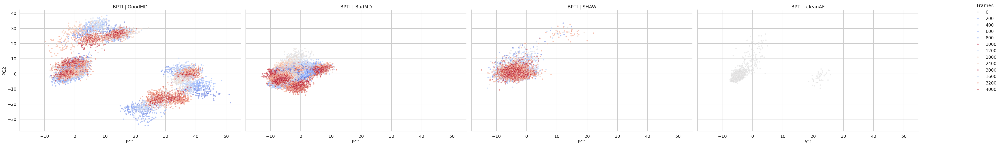

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style for seaborn
sns.set_style("whitegrid")

# Create the FacetGrid
g = sns.FacetGrid(BPTI_pca_df, row="Protein", col="Ensemble", height=8, aspect=1.5, 
                  sharex=True, sharey=True)

# Map the scatter plot to the grid
g.map(sns.scatterplot, "PC1", "PC2", "Index", alpha=0.5, s=30, palette="coolwarm")

# Customize the plot
g.add_legend(title="Frames", bbox_to_anchor=(1.05, 1), loc='upper left')
g.set_axis_labels("PC1", "PC2")
g.set_titles(col_template="{col_name}", row_template="{row_name}")

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

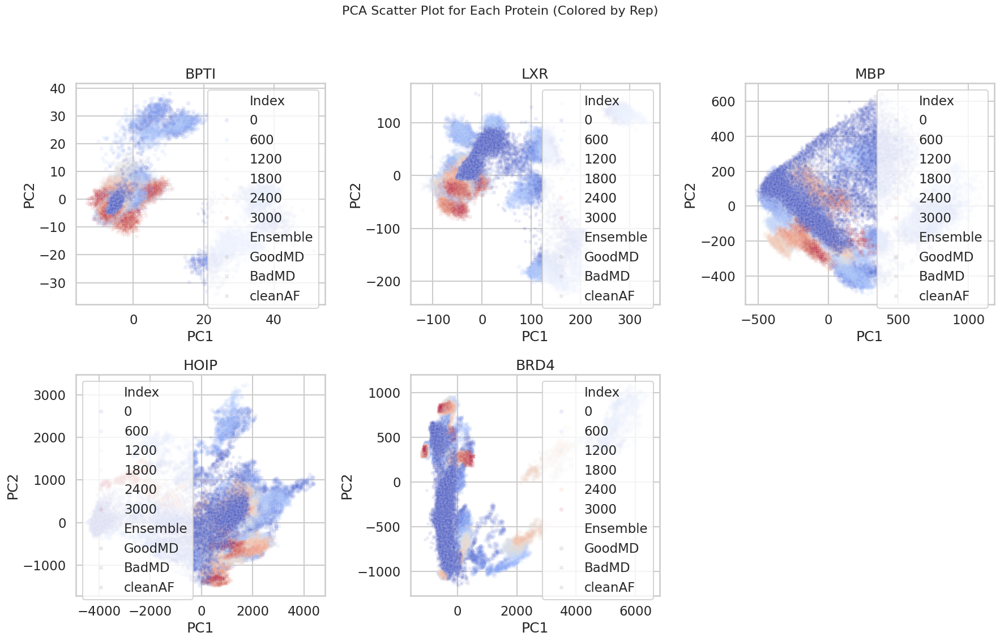

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style for seaborn
sns.set_style("whitegrid")

# Create a subplot grid
num_proteins = len(pca_df['Protein'].unique())
num_cols = 3
num_rows = (num_proteins - 1) // num_cols + 1

# Create the figure and axes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(6*num_cols, 6*num_rows))
fig.suptitle('PCA Scatter Plot for Each Protein (Colored by Rep)', fontsize=16)

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Iterate over each protein and add plots to the subplots
for i, protein in enumerate(pca_df['Protein'].unique()):
    protein_df = pca_df[pca_df['Protein'] == protein]
    
    # Create the scatter plot
    sns.scatterplot(data=protein_df, x='PC1', y='PC2', hue='Index', style='Ensemble',
                    palette='coolwarm', alpha=0.1, s=30, ax=axes[i])
    
    # Set the title for each subplot
    axes[i].set_title(protein)


# Remove any unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])


# Adjust the layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Show the plot
plt.show()

GoodMD
BadMD
cleanAF
GoodMD
BadMD
cleanAF
GoodMD
BadMD


cleanAF
GoodMD
BadMD
cleanAF
GoodMD
BadMD
cleanAF


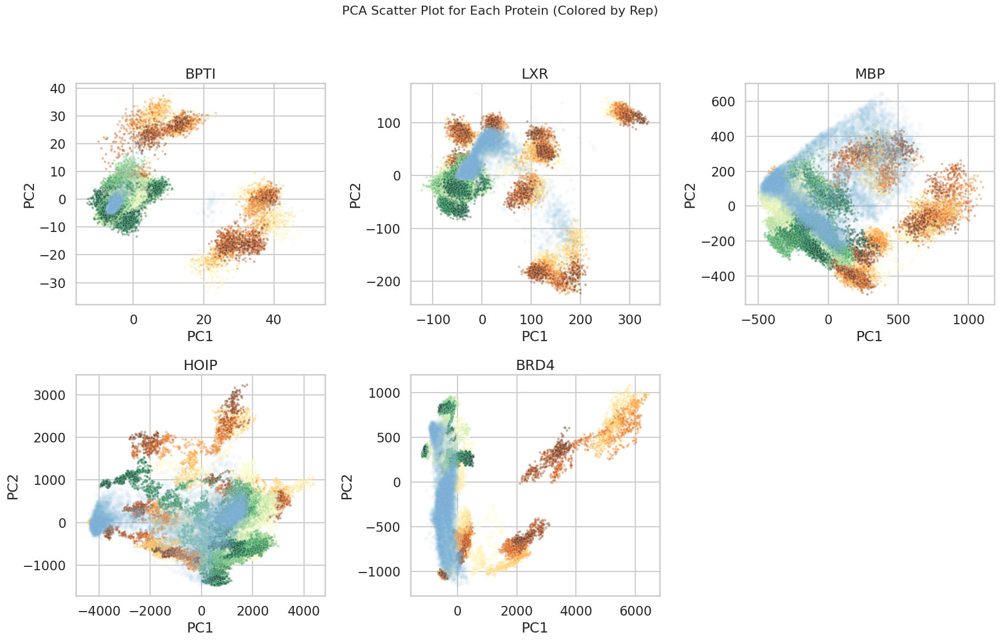

In [45]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Set the style for seaborn
sns.set_style("whitegrid")

# Create a subplot grid
num_proteins = len(pca_df['Protein'].unique())
num_cols = 3
num_rows = (num_proteins - 1) // num_cols + 1

# Create the figure and axes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(6*num_cols, 6*num_rows))
fig.suptitle('PCA Scatter Plot for Each Protein (Colored by Rep)', fontsize=16)

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Get unique Ensemble values
ensembles = pca_df['Ensemble'].unique()


# Iterate over each protein and add plots to the subplots
for i, protein in enumerate(pca_df['Protein'].unique()):
    protein_df = pca_df[pca_df['Protein'] == protein]
    color_palettes = {"GoodMD": sns.color_palette("YlOrBr", as_cmap=True),
                    "BadMD": sns.color_palette("YlGn", as_cmap=True),
                    # "cleanAF":sns.cubehelix_palette(as_cmap=True)}
                        "cleanAF":sns.color_palette("Blues", len(protein_df[protein_df["Ensemble"]=="cleanAF"]['Index'].unique()))}

    opacity = {"GoodMD": 0.4, "BadMD": 0.4, "cleanAF": 0.05}
    size = {"GoodMD": 10, "BadMD": 10, "cleanAF": 30}
    # Create the scatter plot
    for ensemble in ["GoodMD", "BadMD", "cleanAF"]:
        ensemble_df = protein_df[protein_df['Ensemble'] == ensemble]
        print(ensemble)

            
        sns.scatterplot(data=ensemble_df, x='PC1', y='PC2', hue='Index', 
                        palette=color_palettes[ensemble], 
                        style='Ensemble', alpha=opacity[ensemble], s=size[ensemble], ax=axes[i])
    
    # Set the title for each subplot
    axes[i].set_title(protein)
    # remove legend
    axes[i].get_legend().remove()

    # Adjust legend
    # axes[i].legend(title='Index - Ensemble', bbox_to_anchor=(1.05, 1), loc='upper left')

# Remove any unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust the layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Show the plot
plt.show()

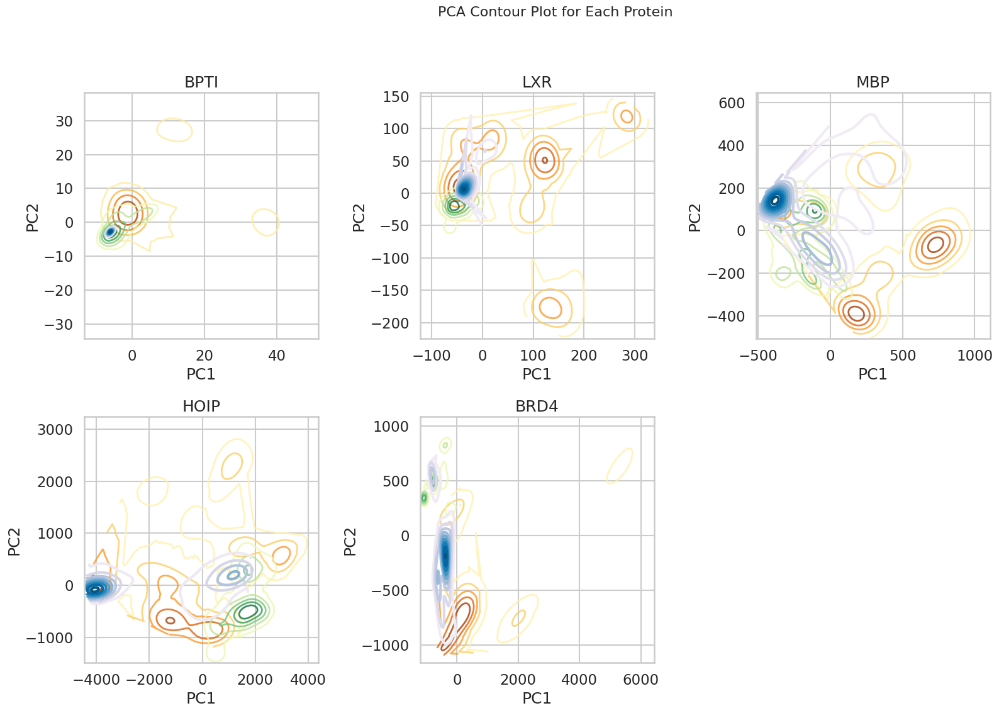

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# Set the style for seaborn
sns.set_style("whitegrid")

# Create a subplot grid
num_proteins = len(pca_df['Protein'].unique())
num_cols = 3
num_rows = (num_proteins - 1) // num_cols + 1

# Create the figure and axes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(6*num_cols, 6*num_rows))
fig.suptitle('PCA Contour Plot for Each Protein', fontsize=16)

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Get unique Ensemble values
ensembles = pca_df['Ensemble'].unique()

# Define color schemes and contour levels
color_schemes = {"GoodMD": "YlOrBr", "BadMD": "YlGn", "cleanAF": "PuBu"}
contour_levels = {"GoodMD": 5, "BadMD": 5, "cleanAF": 10}
opacity = {"GoodMD": 0.8, "BadMD": 0.8, "cleanAF": 1}
linewidths = {"GoodMD": 2, "BadMD": 2, "cleanAF": 3}
# Iterate over each protein and add plots to the subplots
for i, protein in enumerate(pca_df['Protein'].unique()):
    protein_df = pca_df[pca_df['Protein'] == protein]
    
    # Create the contour plot
    for ensemble in ["GoodMD", "BadMD", "cleanAF"]:
        ensemble_df = protein_df[protein_df['Ensemble'] == ensemble]
        
        if not ensemble_df.empty:
            x = ensemble_df['PC1']
            y = ensemble_df['PC2']
            
            # Calculate the point density
            xy = np.vstack([x, y])
            z = gaussian_kde(xy)(xy)
            
            # Sort the points by density
            df_to_plot = ensemble_df.copy()
            df_to_plot['density'] = z
            df_to_plot = df_to_plot.sort_values('density')
            
            # Create contour plot
            contour = axes[i].tricontour(df_to_plot['PC1'], df_to_plot['PC2'], df_to_plot['density'], 
                                          levels=contour_levels[ensemble], 
                                          linewidths=linewidths[ensemble],
                                          cmap=color_schemes[ensemble], alpha=opacity[ensemble])    
    
    # Set the title for each subplot
    axes[i].set_title(protein)
    axes[i].set_xlabel('PC1')
    axes[i].set_ylabel('PC2')

# Remove any unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])



# Adjust the layout
plt.tight_layout(rect=[0, 0.03, 0.9, 0.95])

# Show the plot
plt.show()

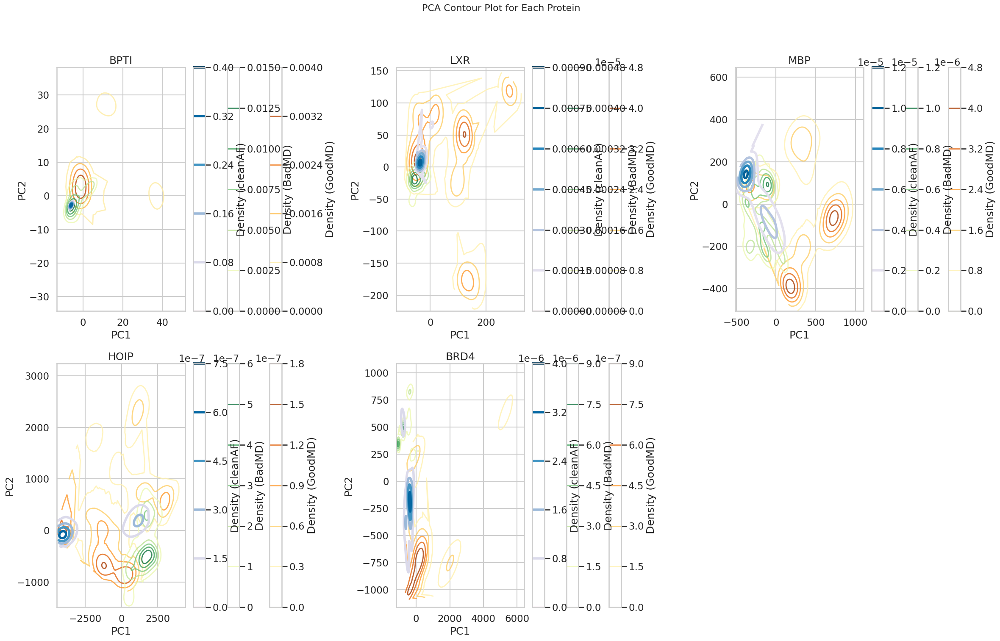

In [47]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import numpy as np

# Set the style for seaborn
sns.set_style("whitegrid")

# Create a subplot grid
num_proteins = len(pca_df['Protein'].unique())
num_cols = 3
num_rows = (num_proteins - 1) // num_cols + 1

# Create the figure and axes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(8*num_cols, 8*num_rows))
fig.suptitle('PCA Contour Plot for Each Protein', fontsize=16)

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Get unique Ensemble values
ensembles = pca_df['Ensemble'].unique()

# Define color schemes and contour levels
color_schemes = {"GoodMD": "YlOrBr", "BadMD": "YlGn", "cleanAF": "PuBu"}
contour_levels = {"GoodMD": 5, "BadMD": 5, "cleanAF": 5}
opacity = {"GoodMD": 0.8, "BadMD": 0.8, "cleanAF": 1}
linewidths = {"GoodMD": 2, "BadMD": 2, "cleanAF": 4}

# Iterate over each protein and add plots to the subplots
for i, protein in enumerate(pca_df['Protein'].unique()):
    protein_df = pca_df[pca_df['Protein'] == protein]
    
    # Create the contour plot
    for ensemble in ["GoodMD", "BadMD", "cleanAF"]:
        ensemble_df = protein_df[protein_df['Ensemble'] == ensemble]
        
        if not ensemble_df.empty:
            x = ensemble_df['PC1']
            y = ensemble_df['PC2']
            
            # Calculate the point density
            xy = np.vstack([x, y])
            z = gaussian_kde(xy)(xy)
            
            # Sort the points by density
            df_to_plot = ensemble_df.copy()
            df_to_plot['density'] = z
            df_to_plot = df_to_plot.sort_values('density')
            
            # Create contour plot
            contour = axes[i].tricontour(df_to_plot['PC1'], df_to_plot['PC2'], df_to_plot['density'],
                                         levels=contour_levels[ensemble],
                                         linewidths=linewidths[ensemble],
                                         cmap=color_schemes[ensemble], alpha=opacity[ensemble])
            
            # Add colorbar
            cbar = plt.colorbar(contour, ax=axes[i], orientation='vertical')#, pad=0.1)
            cbar.set_label(f'Density ({ensemble})')
    
    # Set the title for each subplot
    axes[i].set_title(protein)
    axes[i].set_xlabel('PC1')
    axes[i].set_ylabel('PC2')

# Remove any unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust the layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Show the plot
plt.show()

In [48]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# import numpy as np

# # Set the style for seaborn
# sns.set_style("whitegrid")

# # Create a subplot grid
# num_proteins = len(pca_df['Protein'].unique())
# num_cols = 3
# num_rows = (num_proteins - 1) // num_cols + 1

# # Create the figure and axes
# fig, axes = plt.subplots(num_rows, num_cols, figsize=(6*num_cols, 6*num_rows))
# fig.suptitle('PCA Scatter Plot for Each Protein (Colored by Rep)', fontsize=16)

# # Flatten the axes array for easier indexing
# axes = axes.flatten()

# # Get unique Ensemble values
# ensembles = umap_df['Ensemble'].unique()


# # Iterate over each protein and add plots to the subplots
# for i, protein in enumerate(umap_df['Protein'].unique()):
#     protein_df = umap_df[umap_df['Protein'] == protein]
#     color_palettes = {"GoodMD": sns.color_palette("YlOrBr", as_cmap=True),
#                     "BadMD": sns.color_palette("YlGn", as_cmap=True),
#                     # "cleanAF":sns.cubehelix_palette(as_cmap=True)}
#                         "cleanAF":sns.color_palette("Greys", len(protein_df[protein_df["Ensemble"]=="cleanAF"]['Index'].unique()))}

#     opacity = {"GoodMD": 0.4, "BadMD": 0.4, "cleanAF": 0.1}
#     # Create the scatter plot
#     for ensemble in ensembles:
#         ensemble_df = protein_df[protein_df['Ensemble'] == ensemble]
#         print(ensemble)

            
#         sns.scatterplot(data=ensemble_df, x='UMAP1', y='UMAP2', hue='Index', 
#                         palette=color_palettes[ensemble], 
#                         style='Ensemble', alpha=opacity[ensemble], s=30, ax=axes[i])
    
#     # Set the title for each subplot
#     axes[i].set_title(protein)
#     # remove legend
#     axes[i].get_legend().remove()

#     # Adjust legend
#     # axes[i].legend(title='Index - Ensemble', bbox_to_anchor=(1.05, 1), loc='upper left')

# # Remove any unused subplots
# for j in range(i+1, len(axes)):
#     fig.delaxes(axes[j])

# # Adjust the layout
# plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# # Show the plot
# plt.show()

In [49]:
pca_df.Frames.value_counts()

Frames
750      76
671      76
658      76
659      76
660      76
         ..
11660     1
11661     1
11662     1
11663     1
11587     1
Name: count, Length: 11820, dtype: int64

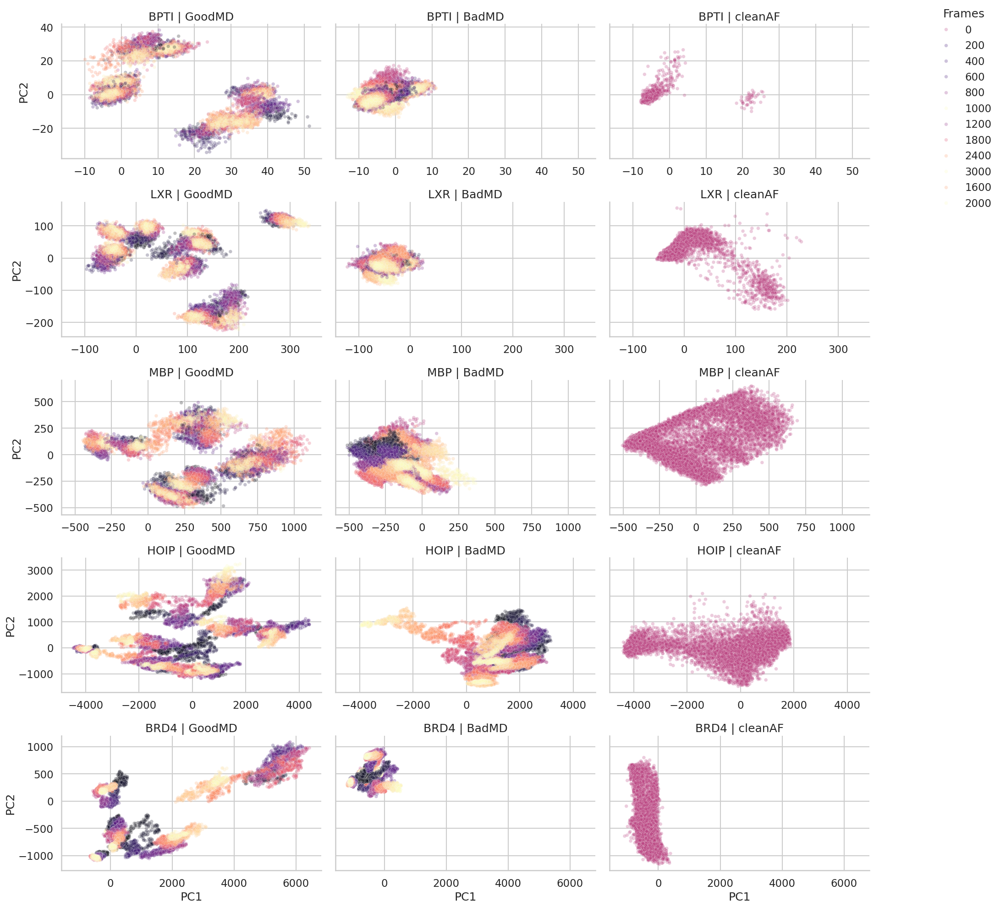

In [50]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style for seaborn
sns.set_style("whitegrid")

# Create the FacetGrid
g = sns.FacetGrid(pca_df, row="Protein", col="Ensemble", height=4, aspect=1.5, 
                  sharex='row', sharey='row')

# Map the scatter plot to the grid
g.map(sns.scatterplot, "PC1", "PC2", "Index", alpha=0.25, s=30, palette="magma")

# Customize the plot
g.add_legend(title="Frames", bbox_to_anchor=(1.05, 1), loc='upper left')
g.set_axis_labels("PC1", "PC2")
g.set_titles(col_template="{col_name}", row_template="{row_name}")

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

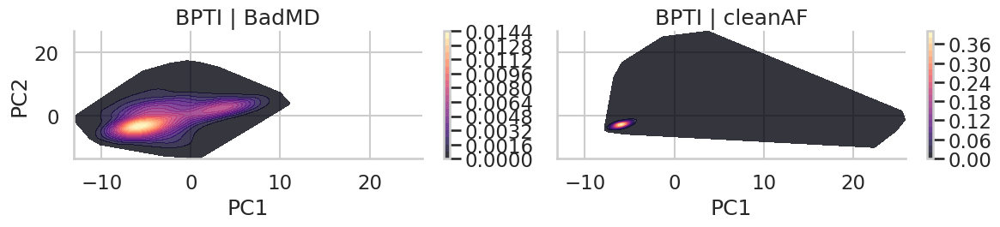

In [68]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde

# Set the style for seaborn
sns.set_style("whitegrid")
_pca_df = pca_df[pca_df["Protein"] == "BPTI"]
_pca_df = _pca_df[_pca_df["Ensemble"].isin(["BadMD", "cleanAF"])]
# Create the FacetGrid
g = sns.FacetGrid(_pca_df, row="Protein", col="Ensemble", height=3, aspect=2,
                  sharex='row', sharey='row')

# Define a function to create filled contour plots
def plot_density_contour(x, y, **kwargs):
    # Calculate the point density
    xy = np.vstack([x, y])
    z = gaussian_kde(xy)(xy)
    
    # Create filled contour plot
    plt.tricontourf(x, y, z, levels=20, cmap="magma", alpha=0.8)

    # add colorbar
    plt.colorbar()
    

# Map the contour plot to the grid
g.map(plot_density_contour, "PC1", "PC2")

# Customize the plot
g.set_axis_labels("PC1", "PC2")
g.set_titles(col_template="{col_name}", row_template="{row_name}")

# Add a colorbar


# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

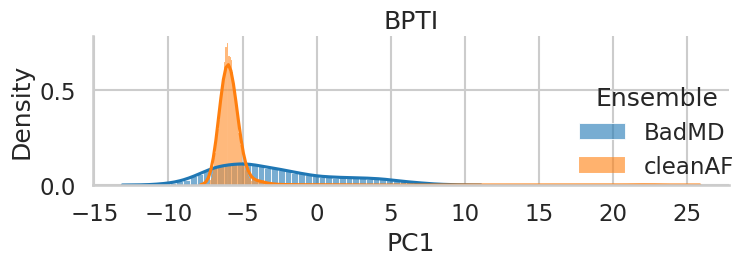

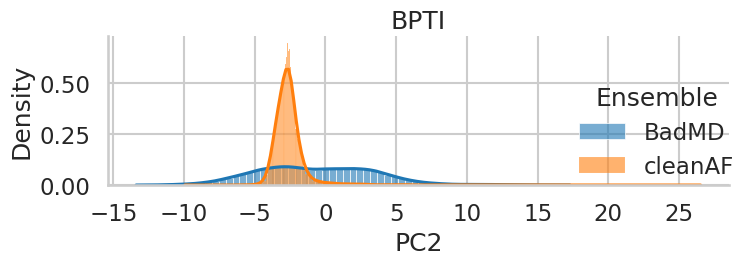

In [81]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Set the style for seaborn
sns.set_style("whitegrid")

# Assuming _pca_df is already defined
_pca_df = pca_df[pca_df["Protein"] == "BPTI"]
_pca_df = _pca_df[_pca_df["Ensemble"].isin(["BadMD", "cleanAF"])]

# Create the FacetGrid
g = sns.FacetGrid(_pca_df, row="Protein", hue="Ensemble", height=3, aspect=2,
                  sharex='col', sharey='row')

# Define a function to create histograms
def plot_histogram(x, **kwargs):
    sns.histplot(x, kde=True, **kwargs, stat="density")

# Map the histogram plot to the grid for PC1
g.map(plot_histogram, "PC1", alpha=0.6)

# Customize the plot
g.set_axis_labels("PC1", "Density")
g.set_titles(col_template="{col_name}", row_template="{row_name}")


g.add_legend()

# g.set(ylim=(0, 0.5))


# Adjust the layout
plt.tight_layout()

# Show the plot for PC1
plt.show()

# Create another FacetGrid for PC2
g = sns.FacetGrid(_pca_df, row="Protein", hue="Ensemble", height=3, aspect=2,
                  sharex='col', sharey='row')

# Map the histogram plot to the grid for PC2
g.map(plot_histogram, "PC2", alpha=0.6)

# Customize the plot
g.set_axis_labels("PC2", "Density")
g.set_titles(col_template="{col_name}", row_template="{row_name}")

# add legend
g.add_legend()


# Adjust the layout
plt.tight_layout()

# Show the plot for PC2
plt.show()

In [ ]:
phate_df

NameError: name 'phate_df' is not defined

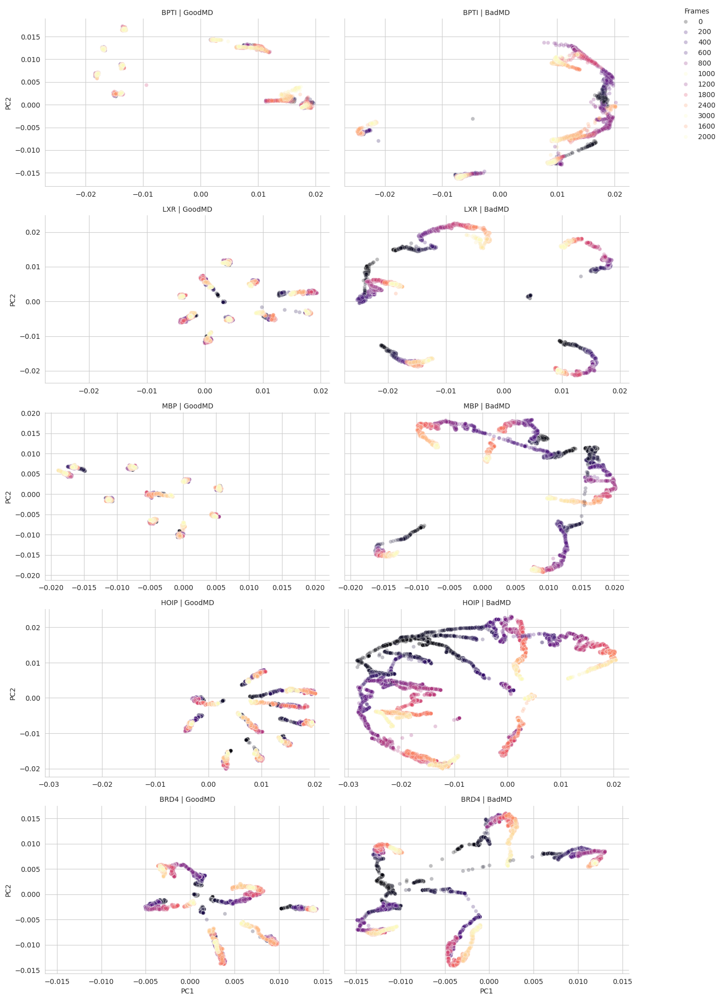

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style for seaborn
sns.set_style("whitegrid")

# Create the FacetGrid
g = sns.FacetGrid(phate_df, row="Protein", col="Ensemble", height=4, aspect=1.5, 
                  sharex='row', sharey='row')

# Map the scatter plot to the grid
g.map(sns.scatterplot, "PHATE1", "PHATE2", "Index", alpha=0.25, s=30, palette="magma")

# Customize the plot
g.add_legend(title="Frames", bbox_to_anchor=(1.05, 1), loc='upper left')
g.set_axis_labels("PC1", "PC2")
g.set_titles(col_template="{col_name}", row_template="{row_name}")

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

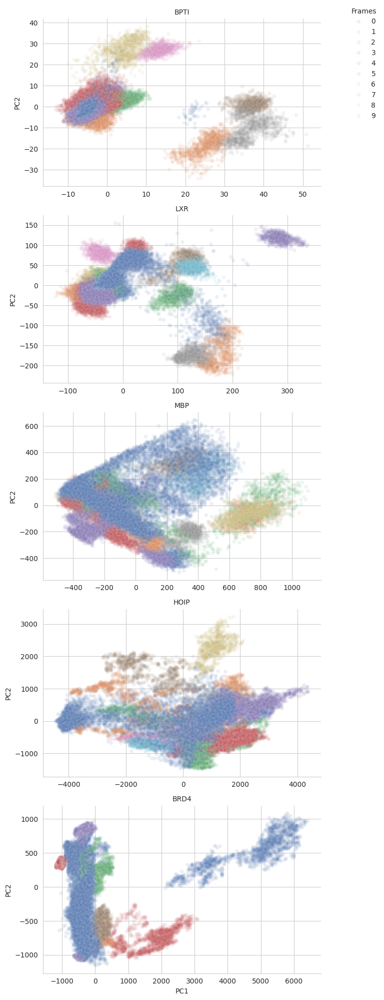

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style for seaborn
sns.set_style("whitegrid")

# Create the FacetGrid
g = sns.FacetGrid(pca_df, row="Protein", height=4, aspect=1.5, 
                  sharex=False, sharey=False)

# Map the scatter plot to the grid
g.map(sns.scatterplot, "PC1", "PC2", "Rep", alpha=0.1, s=30, palette="deep")

# Customize the plot
g.add_legend(title="Frames", bbox_to_anchor=(1.05, 1), loc='upper left')
g.set_axis_labels("PC1", "PC2")
g.set_titles(col_template="{col_name}", row_template="{row_name}")

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()